<a href="https://colab.research.google.com/github/kalp91/7150CEM_Widening-participation-in-Higher-Education-Dissertation-project/blob/main/Copy_of_7150CEM_Data_Science_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

In [ ]:
file_paths = {
    'all_characteristics': '/content/all_characteristics.csv',
    'ethnicity': '/content/ethnicity.csv',
    'fsm': '/content/fsm.csv',
    'fsm_gap': '/content/fsm_gap.csv',
    'fsm_gender_ethnicity': '/content/fsm_gender_ethnicity.csv',
    'fsm_gender_ethnicity_region': '/content/fsm_gender_ethnicity_region.csv',
    'gender': '/content/gender.csv',
    'school_type': '/content/school_type.csv',
    'sen': '/content/sen.csv',
    'tariff_group': '/content/tariff_group.csv',
    'tef': '/content/tef.csv'
}

In [ ]:
# Load datasets into DataFrames
data = {}
for key, path in file_paths.items():
    data[key] = pd.read_csv(path)

In [ ]:
# Checking missing values in each dataset
for key, df in data.items():
    print(f"Dataset: {key}")
    print(df.isnull().sum())  # Display the count of missing values per column
    print("="*50)

Dataset: all_characteristics
time_period                          0
time_identifier                      0
geographic_level                     0
country_code                         0
country_name                         0
characteristic                       0
characteristic_detail                0
progression_rate                     0
high_tariff_progression_rate         0
number_of_he_students                0
number_of_high_tariff_he_students    0
number_of_students                   0
dtype: int64
Dataset: ethnicity
time_period                             0
time_identifier                         0
geographic_level                        0
country_code                            0
country_name                            0
region_code                           312
region_name                           312
old_la_code                          3743
new_la_code                          3931
la_name                              3743
ethnicity_major                         0
ethnicity

In [ ]:
# Remove duplicates if any
for key, df in data.items():
    data[key] = df.drop_duplicates()

In [ ]:
from sklearn.preprocessing import OneHotEncoder

# Perform one-hot encoding for categorical columns
categorical_cols = ['ethnicity_minor', 'fsm_status', 'gender', 'a_level_status', 'sen_status']
for key, df in data.items():
    for col in categorical_cols:
        if col in df.columns:
            encoded_cols = pd.get_dummies(df[col], prefix=col)
            data[key] = pd.concat([df, encoded_cols], axis=1)
            data[key].drop(columns=[col], inplace=True)

In [ ]:
from sklearn.preprocessing import StandardScaler
import numpy as np

numerical_cols = ['high_tariff_progression_rate', 'number_of_he_students', 'number_of_high_tariff_he_students', 'number_of_students', 'progression_rate']
scaler = StandardScaler()

for key, df in data.items():
    for col in numerical_cols:
        if col in df.columns:
            # Convert non-numeric values ('x') to NaN
            df[col] = pd.to_numeric(df[col], errors='coerce')

            # Fill NaN values with mean of the column
            mean_val = df[col].mean()
            df[col].fillna(mean_val, inplace=True)

            # Scale the column
            df[col] = scaler.fit_transform(df[col].values.reshape(-1, 1))

            # Update the data dictionary with the modified DataFrame
            data[key] = df

In [ ]:
# Handling categorical columns - Encoding categorical variables

from sklearn.preprocessing import LabelEncoder

categorical_cols = ['characteristic_detail', 'fsm_status', 'ethnicity_minor', 'ethnicity_major', 'gender', 'a_level_status', 'sen_status', 'tariff_grouping', 'tef_rating', 'school_type']

label_encoders = {}

for key, df in data.items():
    for col in categorical_cols:
        if col in df.columns:
            if col not in label_encoders:
                label_encoders[col] = LabelEncoder()
                df[col] = label_encoders[col].fit_transform(df[col].astype(str))

            # Update the data dictionary with the modified DataFrame
            data[key] = df

Exploratory Data Analysis for all_characteristics:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 630 entries, 0 to 629
Data columns (total 12 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   time_period                        630 non-null    int64  
 1   time_identifier                    630 non-null    object 
 2   geographic_level                   630 non-null    object 
 3   country_code                       630 non-null    object 
 4   country_name                       630 non-null    object 
 5   characteristic                     630 non-null    object 
 6   characteristic_detail              630 non-null    int64  
 7   progression_rate                   630 non-null    float64
 8   high_tariff_progression_rate       630 non-null    float64
 9   number_of_he_students              630 non-null    float64
 10  number_of_high_tariff_he_students  630 non-null    float64
 11  number_

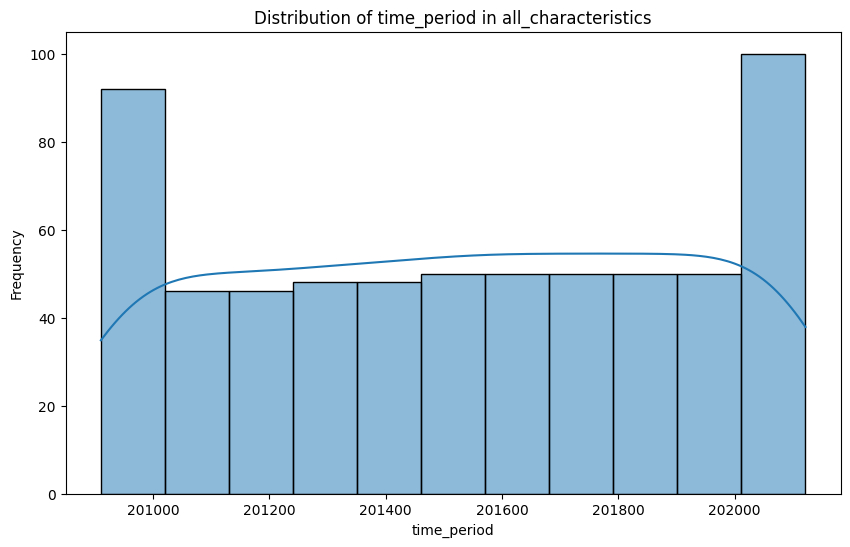

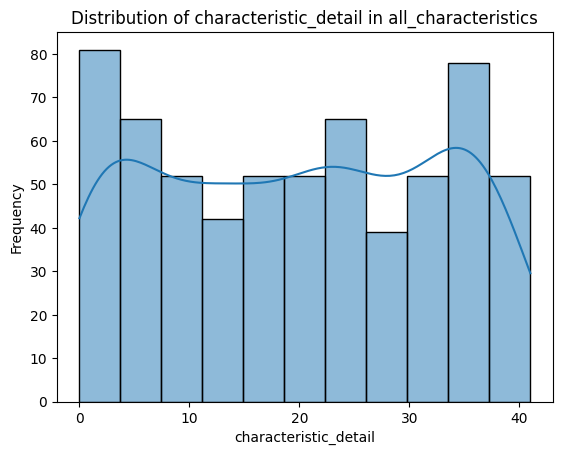

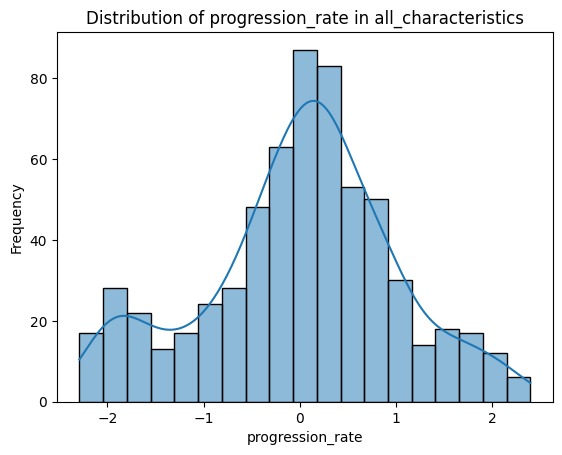

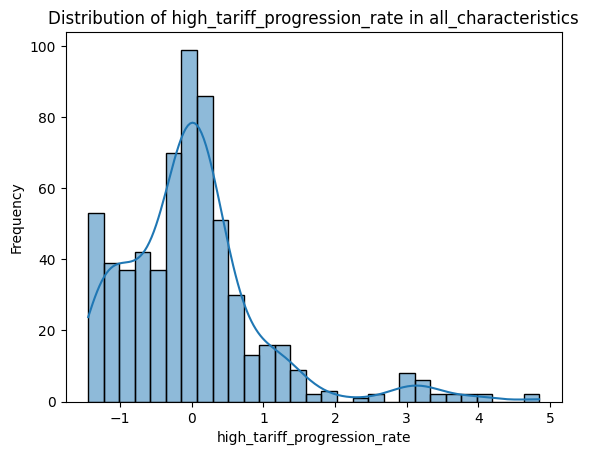

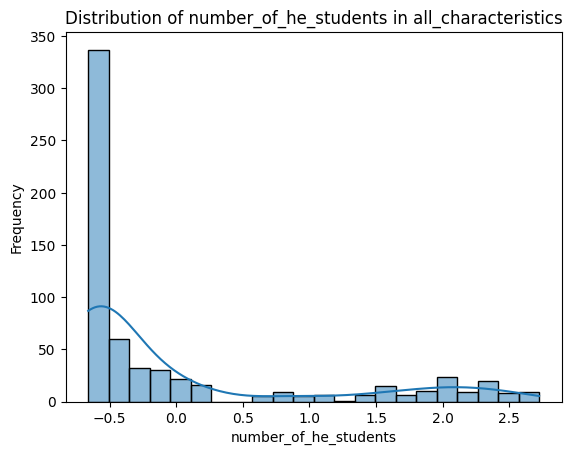

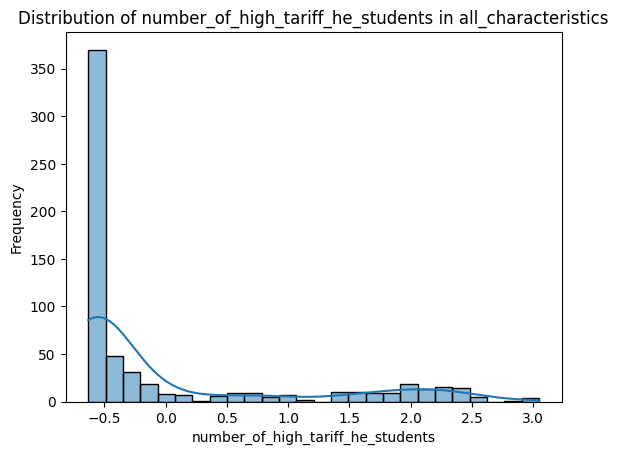

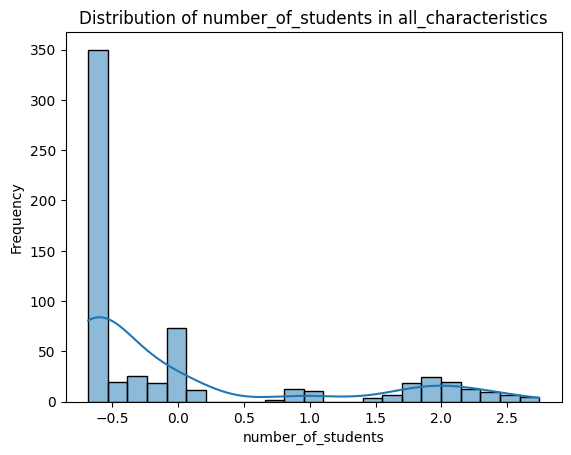

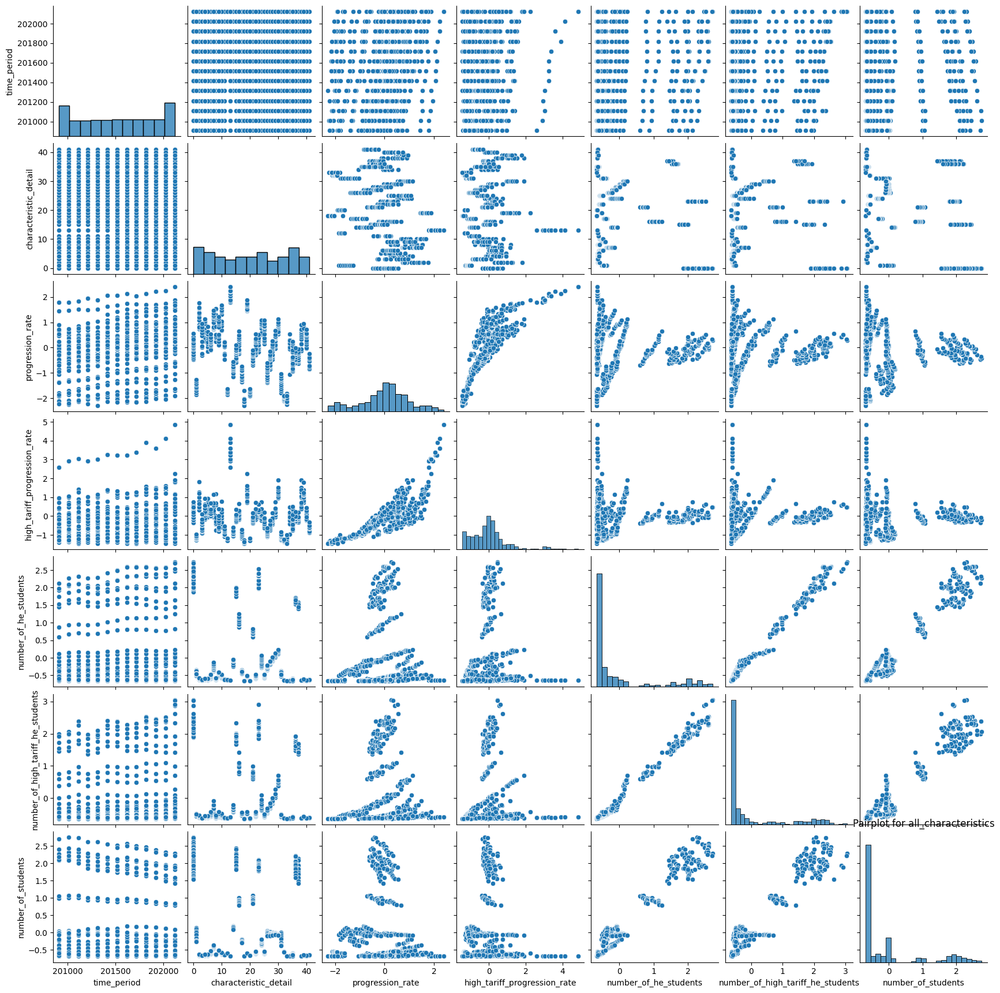

<ipython-input-31-f2ff2c5437dc>:27: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


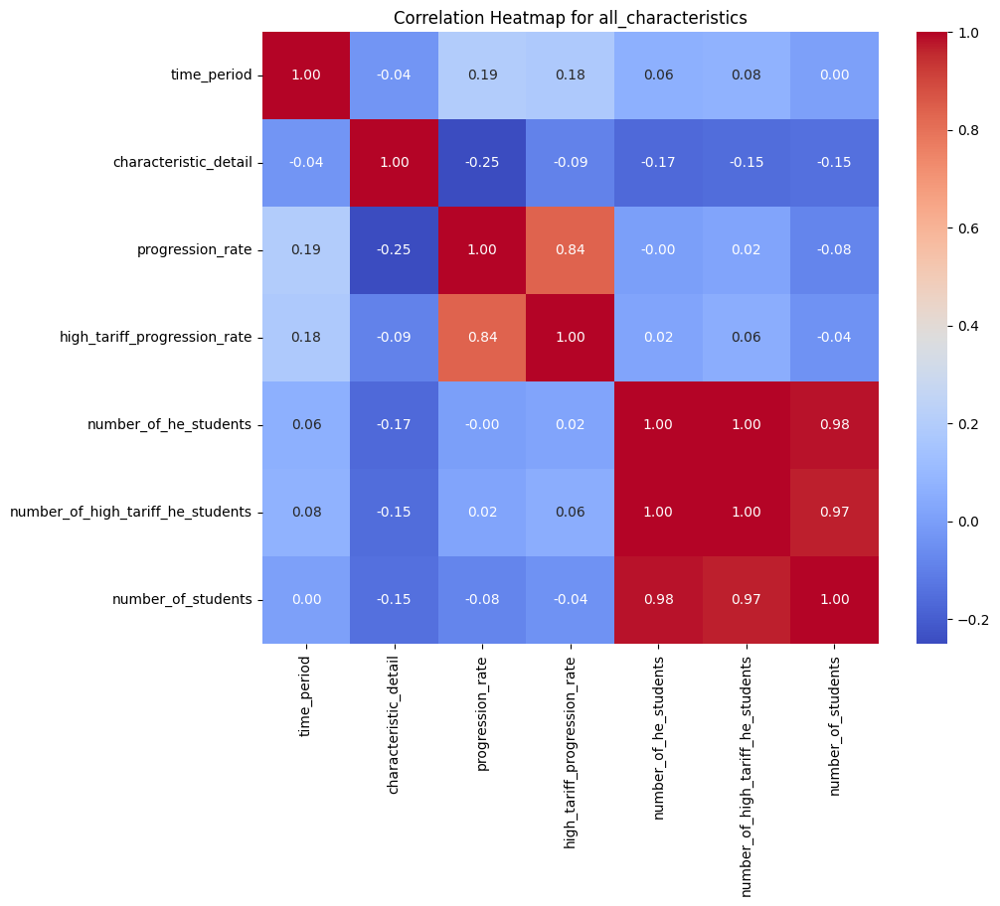

Exploratory Data Analysis for ethnicity:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 47708 entries, 0 to 47707
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   time_period                                  47708 non-null  int64  
 1   time_identifier                              47708 non-null  object 
 2   geographic_level                             47708 non-null  object 
 3   country_code                                 47708 non-null  object 
 4   country_name                                 47708 non-null  object 
 5   region_code                                  47396 non-null  object 
 6   region_name                                  47396 non-null  object 
 7   old_la_code                                  43965 non-null  float64
 8   new_la_code                                  43777 non-null  object 
 9   la_name                        

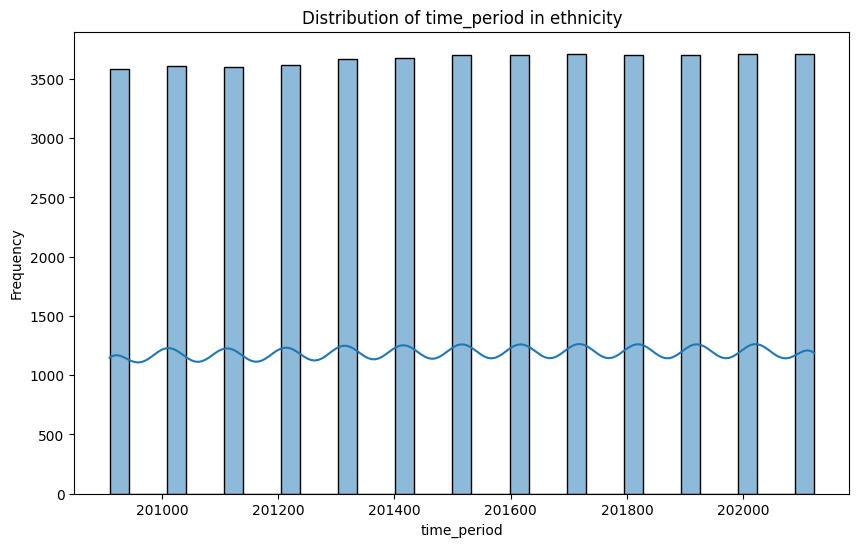

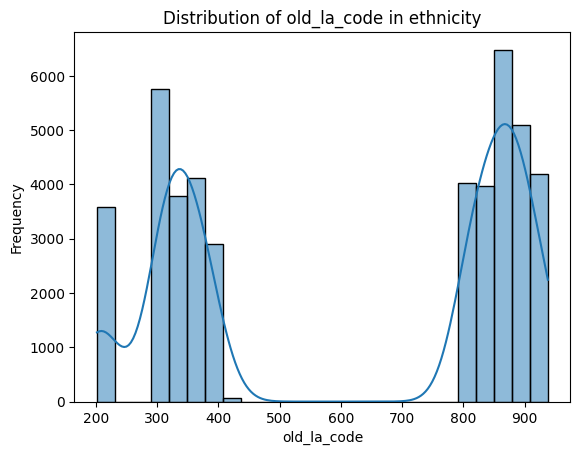

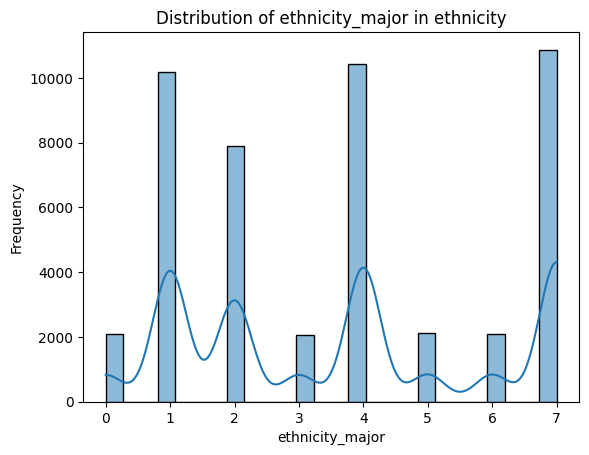

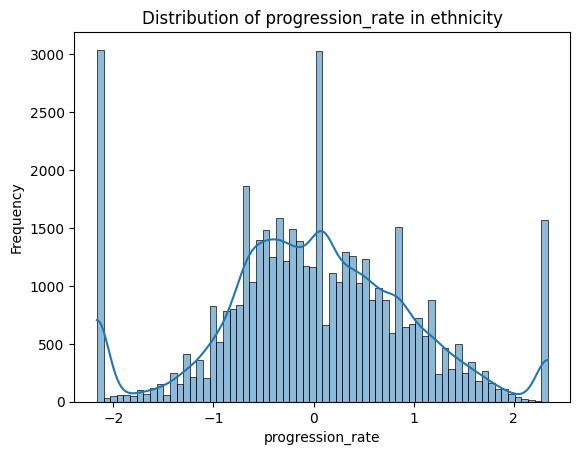

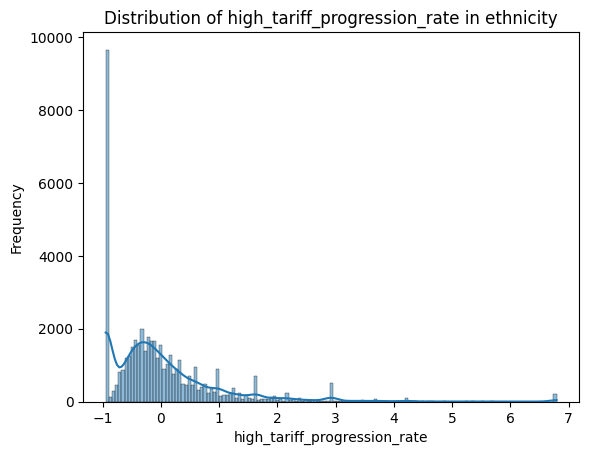

...

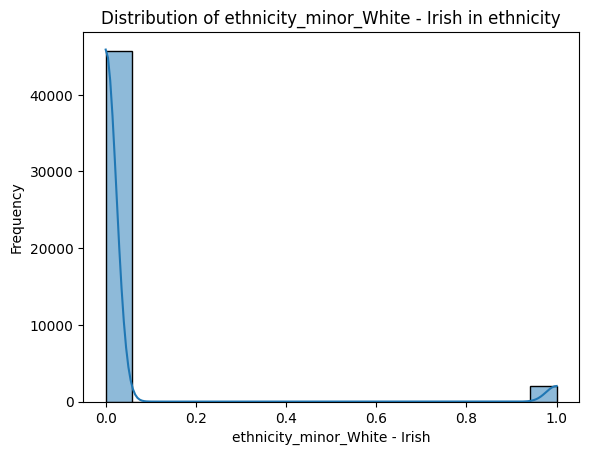

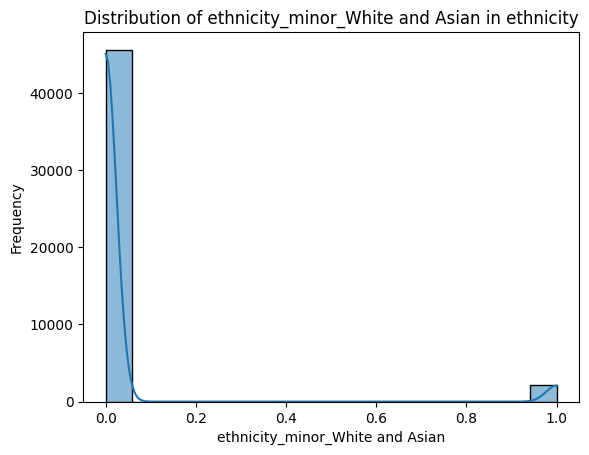

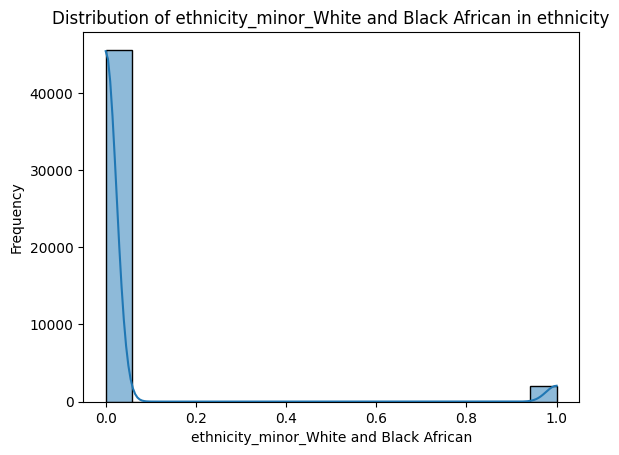

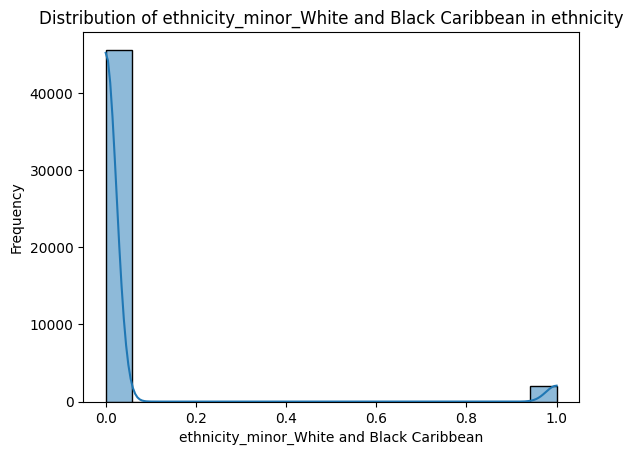

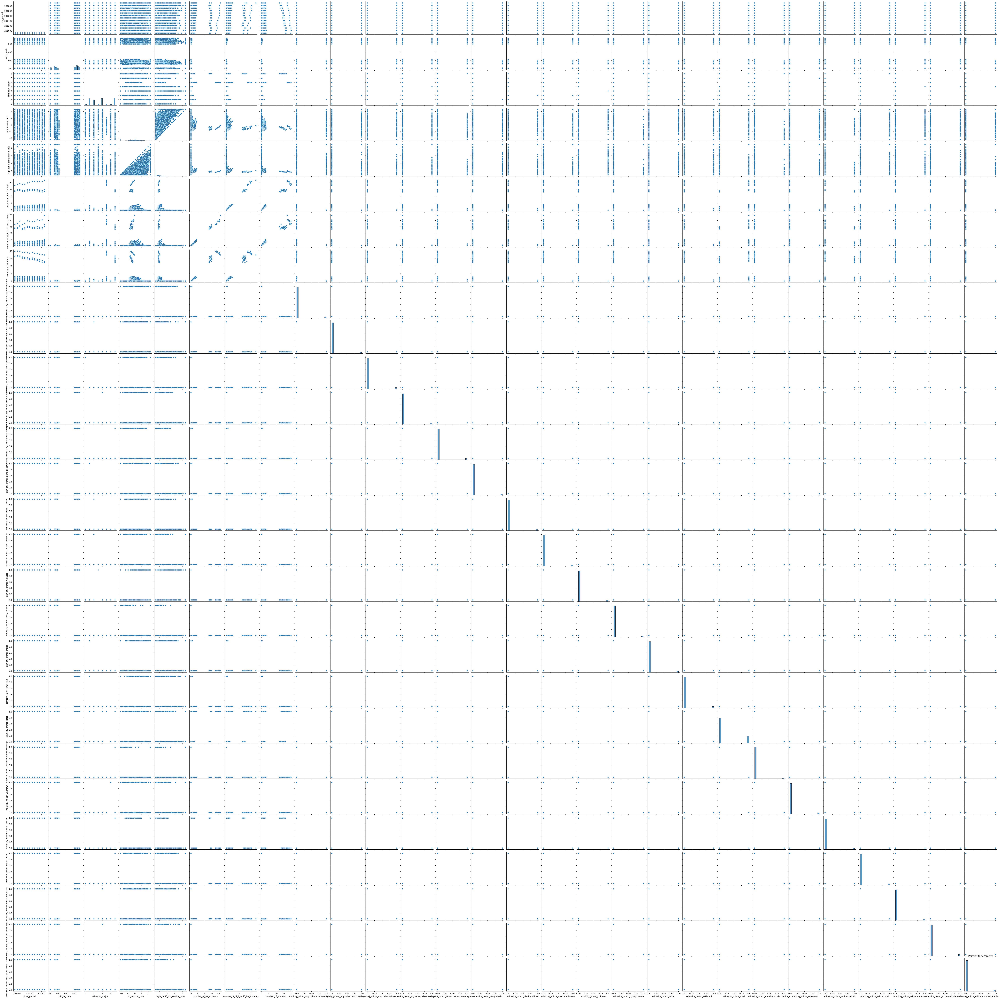

<ipython-input-31-f2ff2c5437dc>:27: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


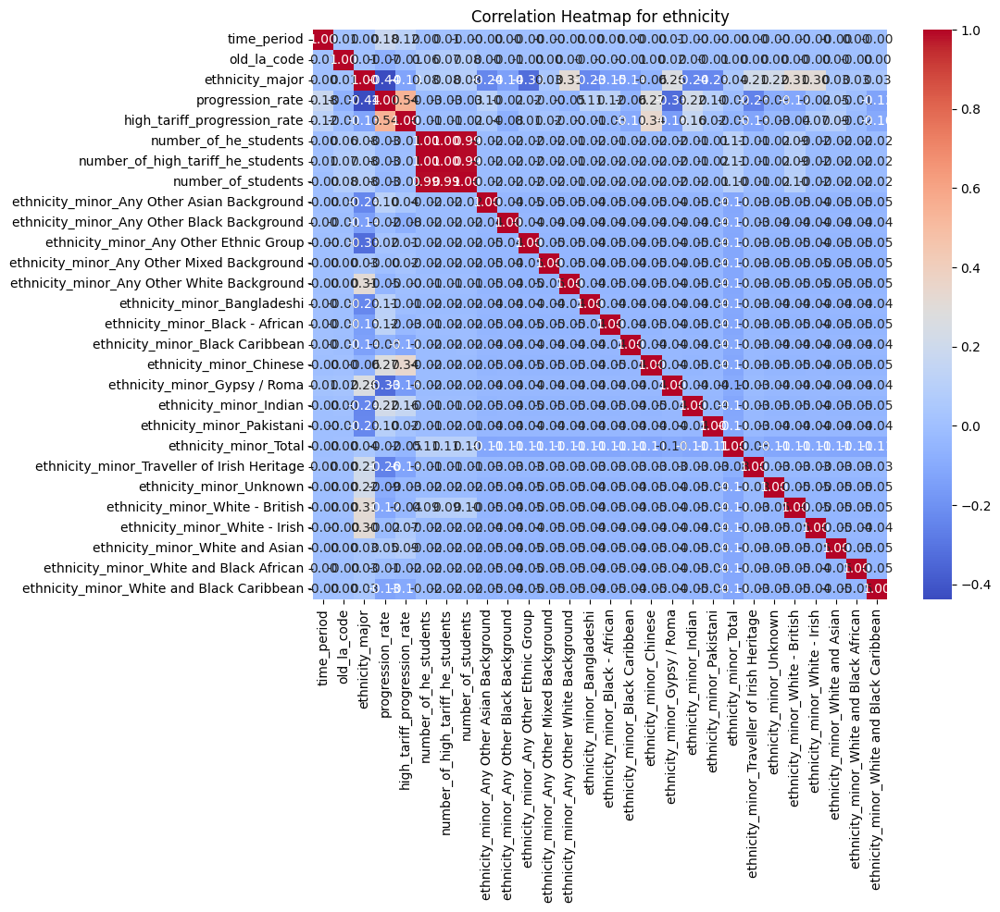

Exploratory Data Analysis for fsm:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8255 entries, 0 to 8254
Data columns (total 18 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   time_period                        8255 non-null   int64  
 1   time_identifier                    8255 non-null   object 
 2   geographic_level                   8255 non-null   object 
 3   country_code                       8255 non-null   object 
 4   country_name                       8255 non-null   object 
 5   region_code                        8204 non-null   object 
 6   region_name                        8204 non-null   object 
 7   old_la_code                        7643 non-null   float64
 8   new_la_code                        7595 non-null   object 
 9   la_name                            7643 non-null   object 
 10  progression_rate                   8255 non-null   float64
 11  high_tariff_progressi

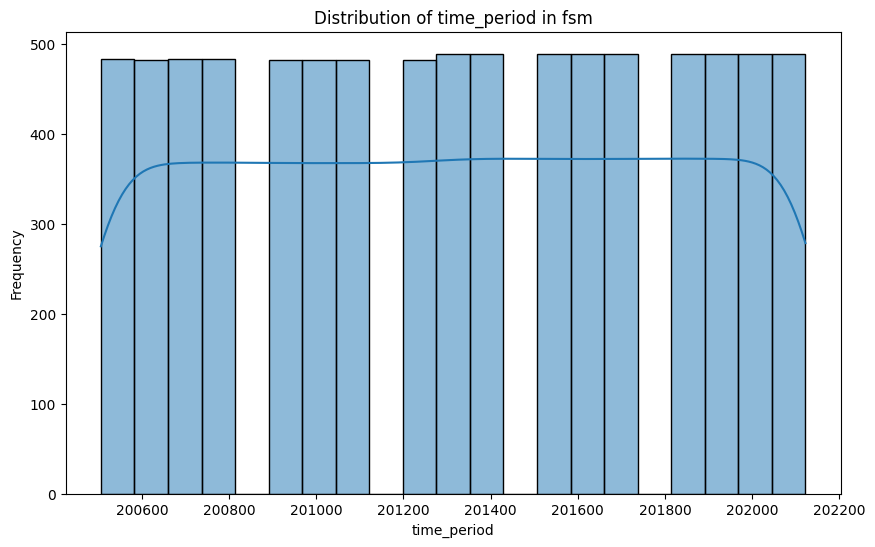

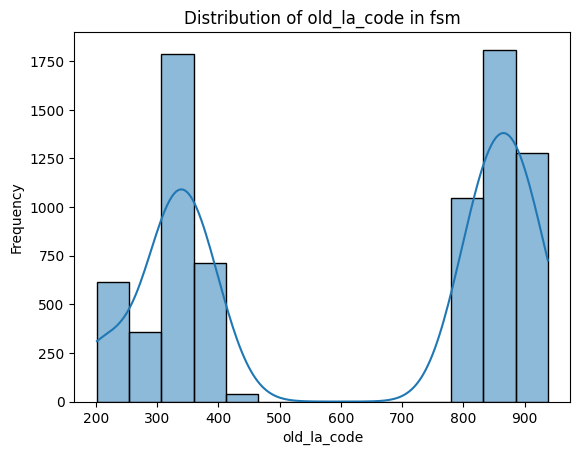

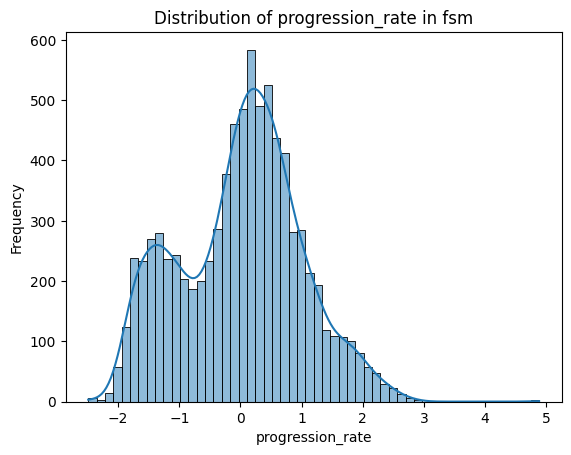

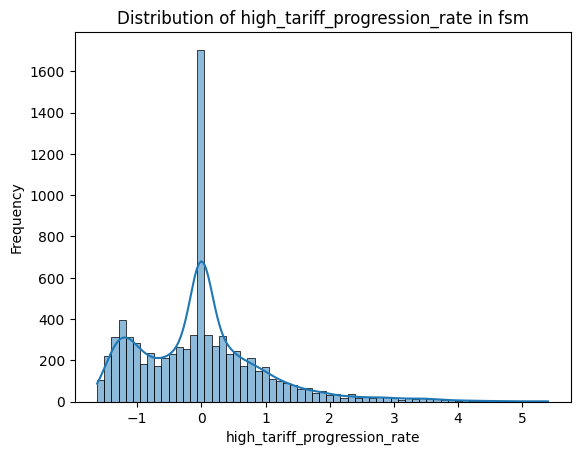

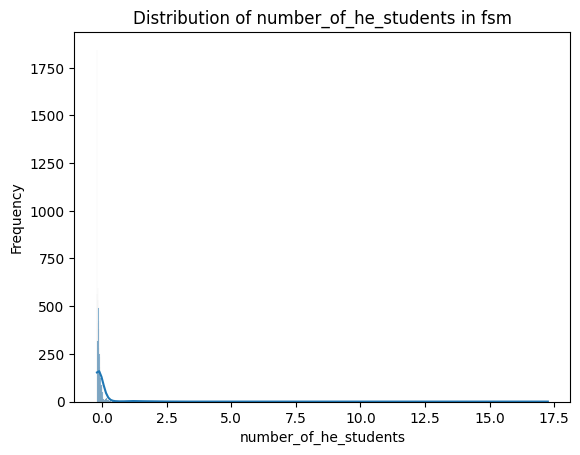

...

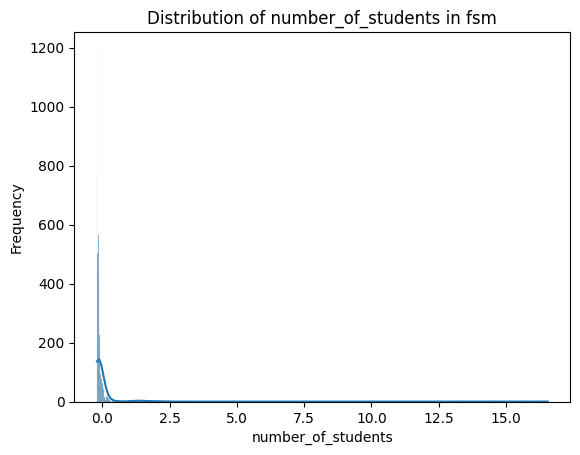

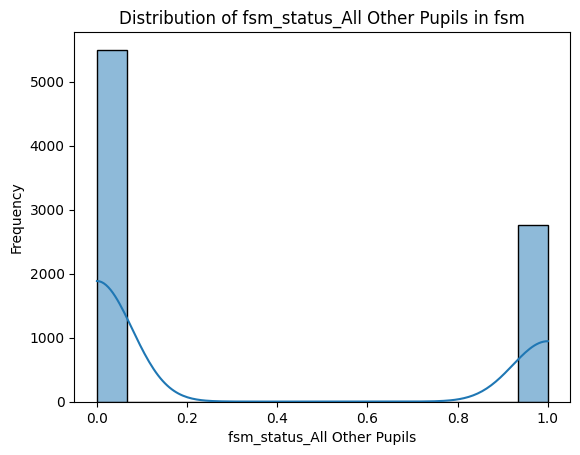

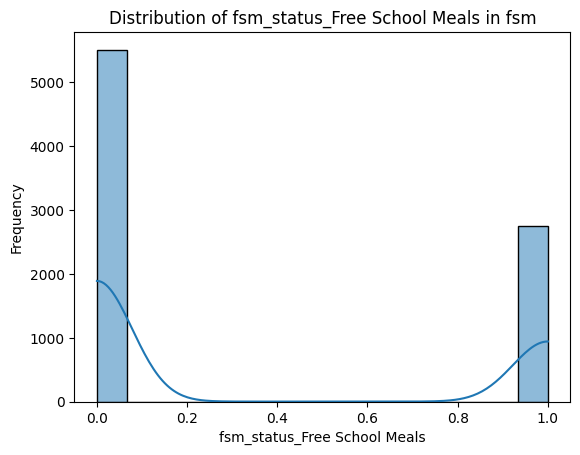

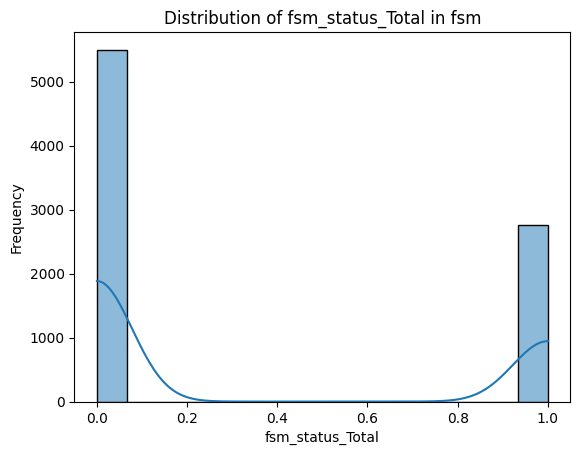

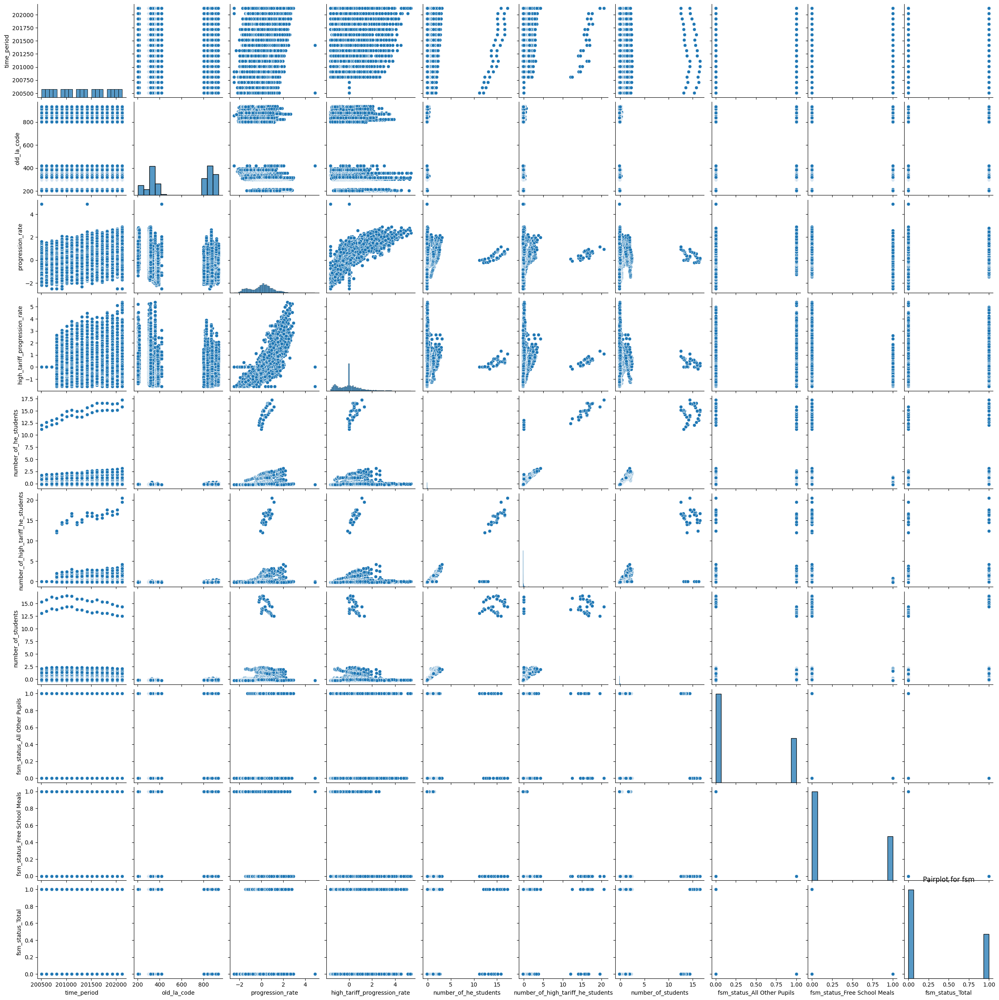

<ipython-input-31-f2ff2c5437dc>:27: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


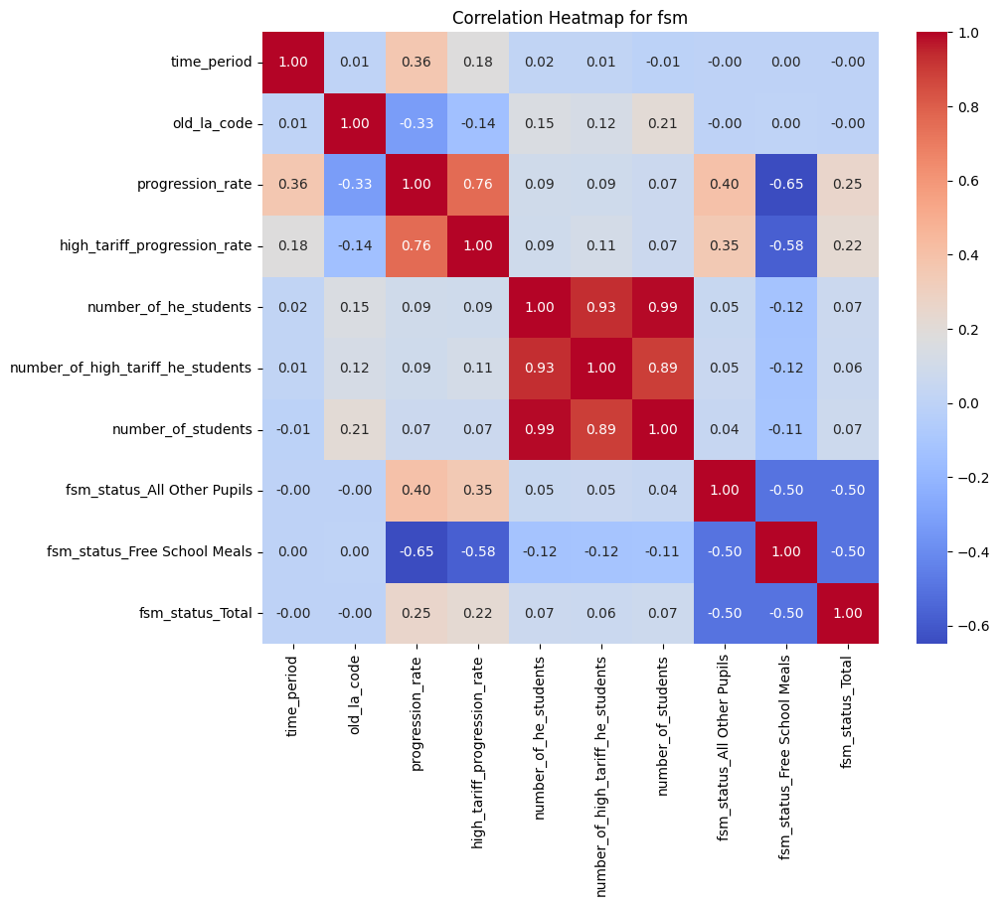

Exploratory Data Analysis for fsm_gap:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2755 entries, 0 to 2754
Data columns (total 18 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   time_period                           2755 non-null   int64  
 1   time_identifier                       2755 non-null   object 
 2   geographic_level                      2755 non-null   object 
 3   country_code                          2755 non-null   object 
 4   country_name                          2755 non-null   object 
 5   region_code                           2738 non-null   object 
 6   region_name                           2738 non-null   object 
 7   old_la_code                           2551 non-null   float64
 8   new_la_code                           2535 non-null   object 
 9   la_name                               2551 non-null   object 
 10  progression_rate_fsm                  2755 no

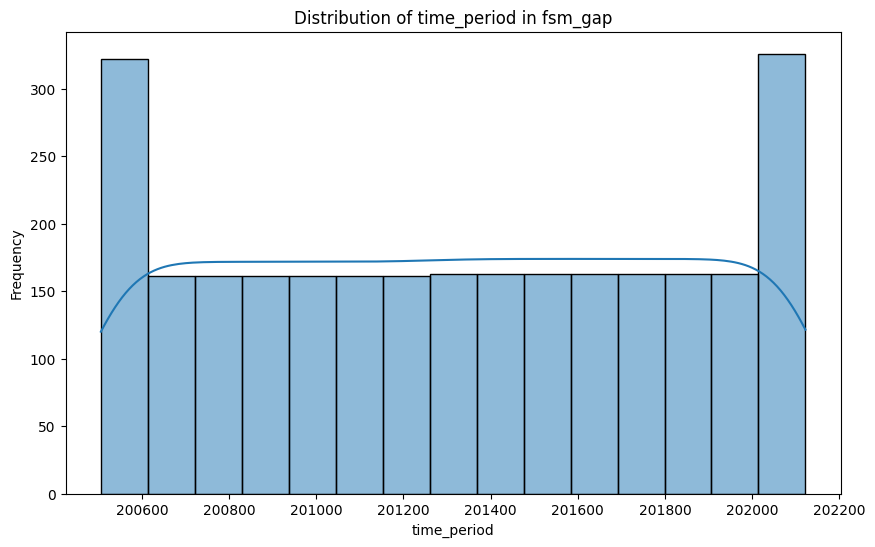

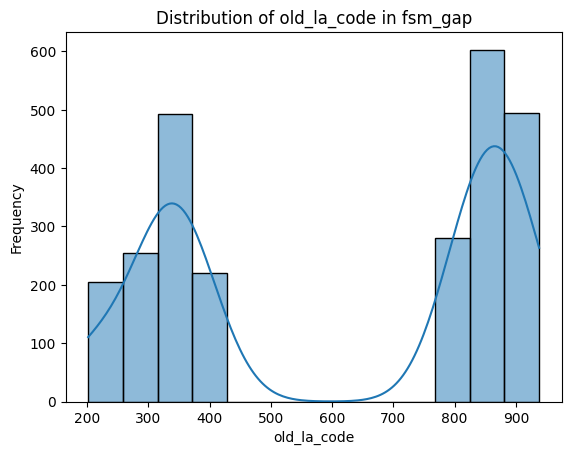

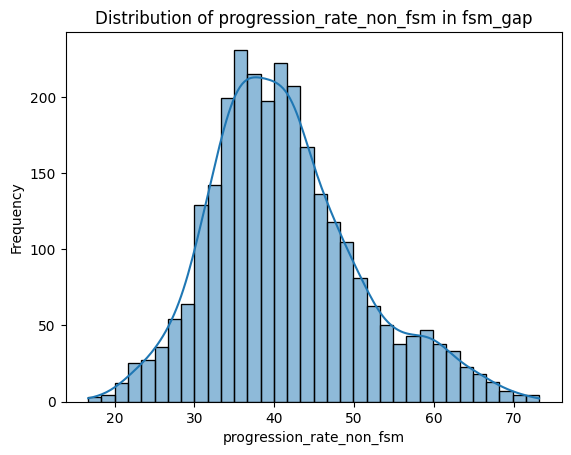

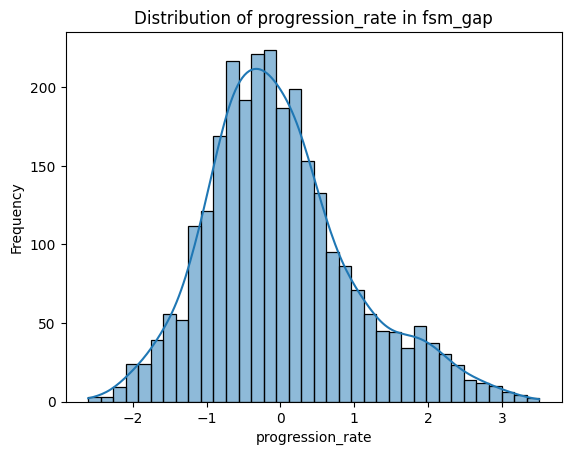

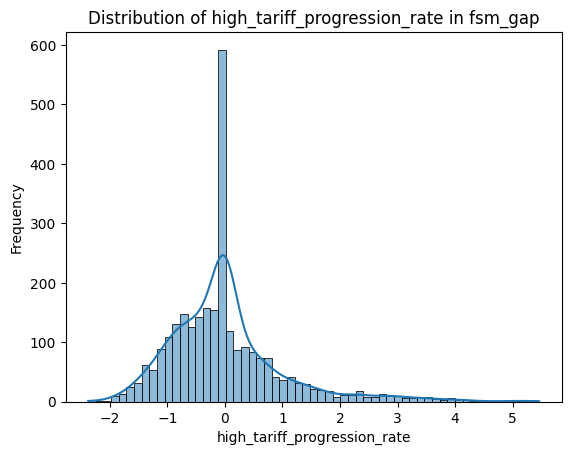

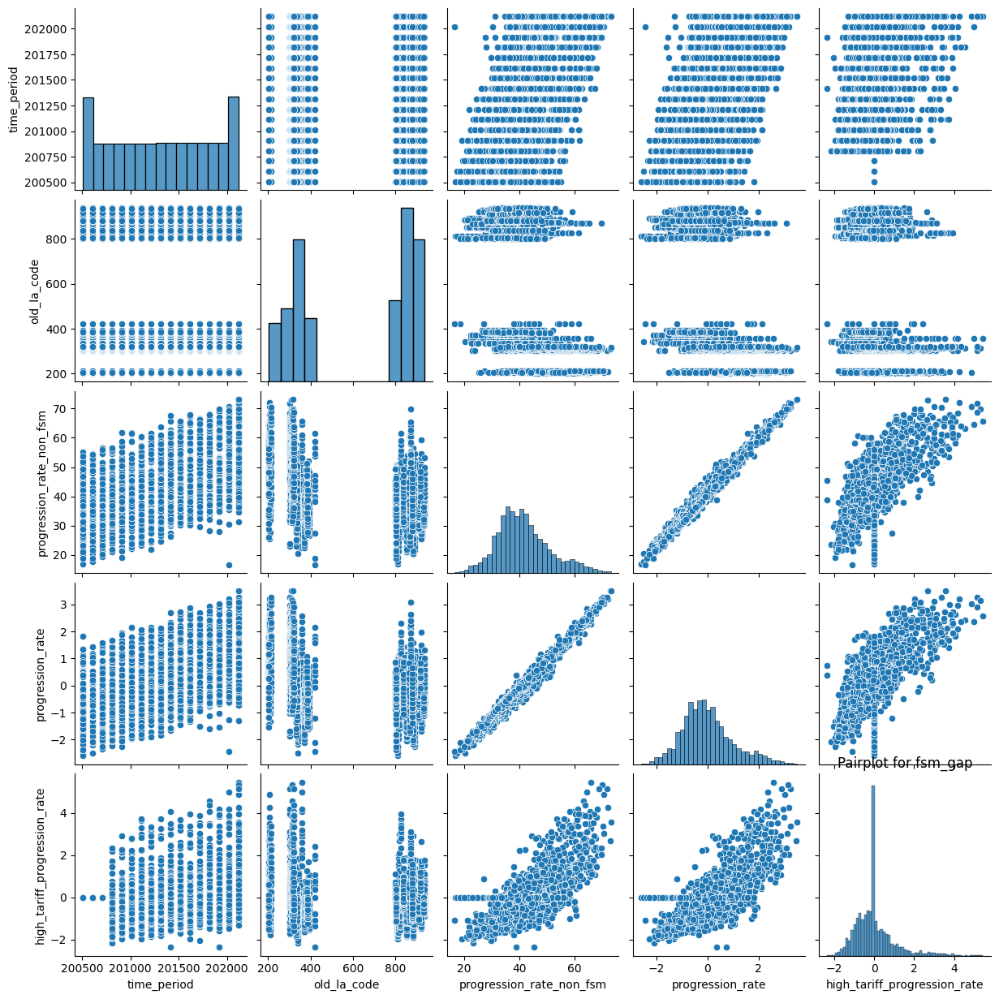

<ipython-input-31-f2ff2c5437dc>:27: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


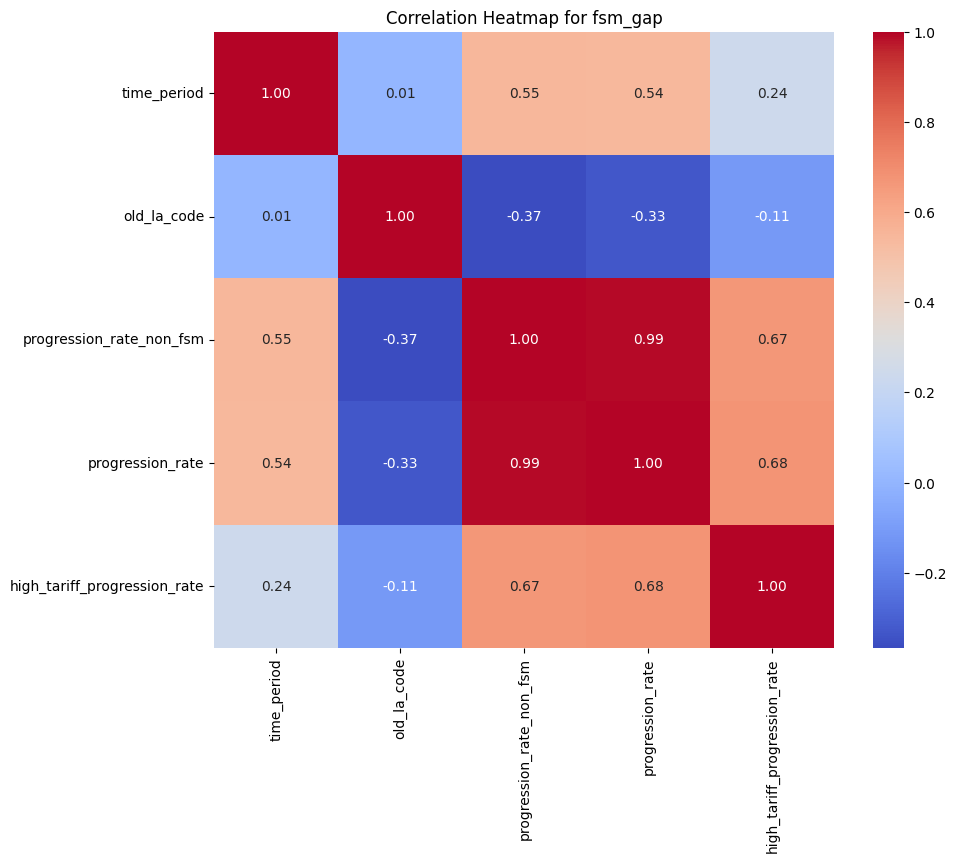

Exploratory Data Analysis for fsm_gender_ethnicity:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2808 entries, 0 to 2807
Data columns (total 16 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   time_period                        2808 non-null   int64  
 1   time_identifier                    2808 non-null   object 
 2   geographic_level                   2808 non-null   object 
 3   country_code                       2808 non-null   object 
 4   country_name                       2808 non-null   object 
 5   fsm_status                         2808 non-null   int64  
 6   ethnicity_major                    2808 non-null   object 
 7   ethnicity_minor                    2808 non-null   int64  
 8   progression_rate                   2808 non-null   float64
 9   high_tariff_progression_rate       2808 non-null   float64
 10  number_of_he_students              2808 non-null   float64
 11  numb

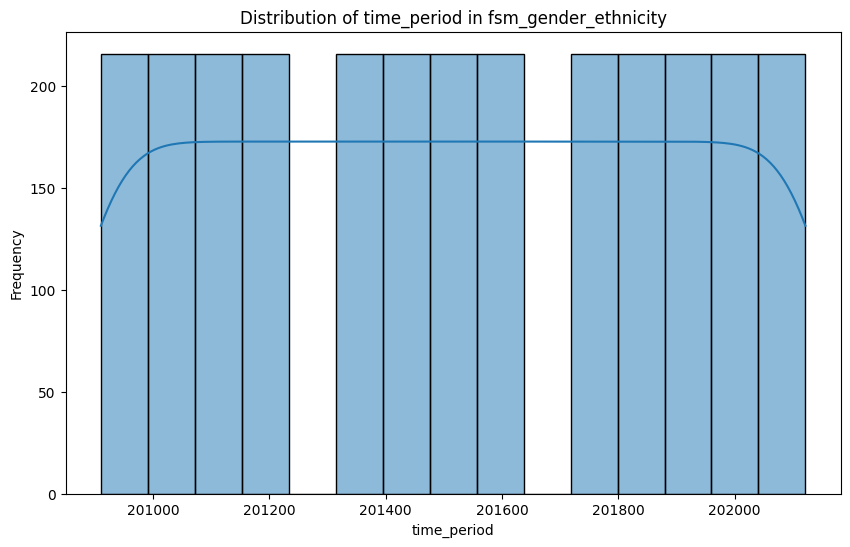

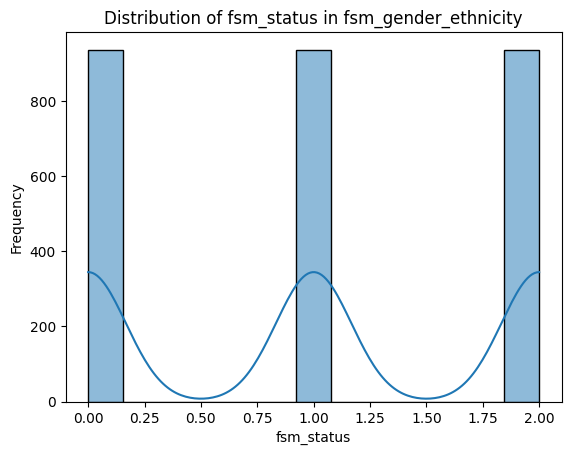

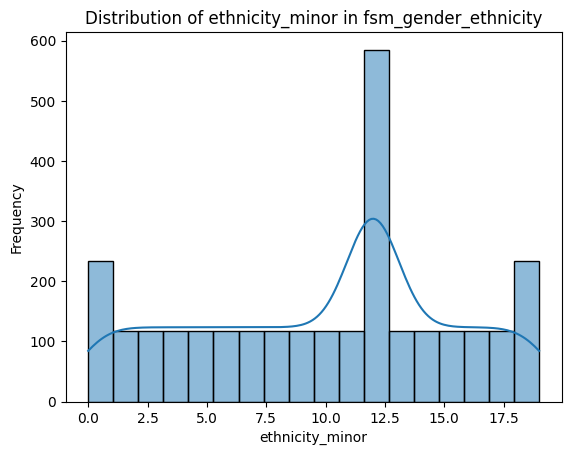

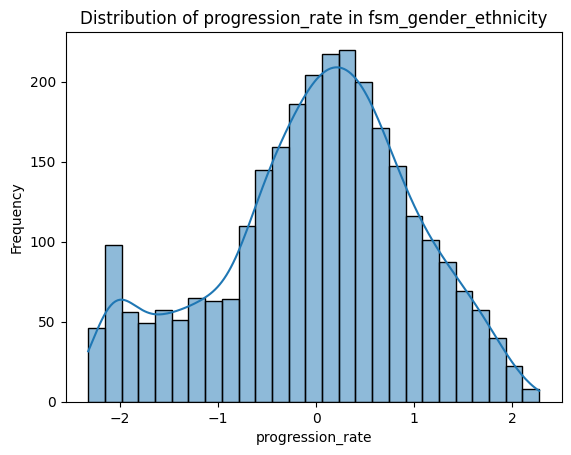

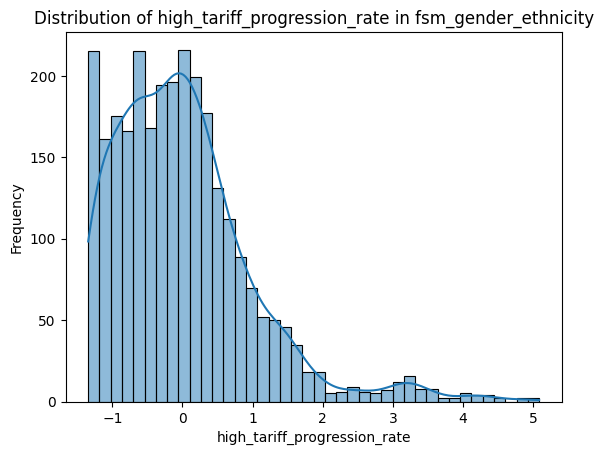

...

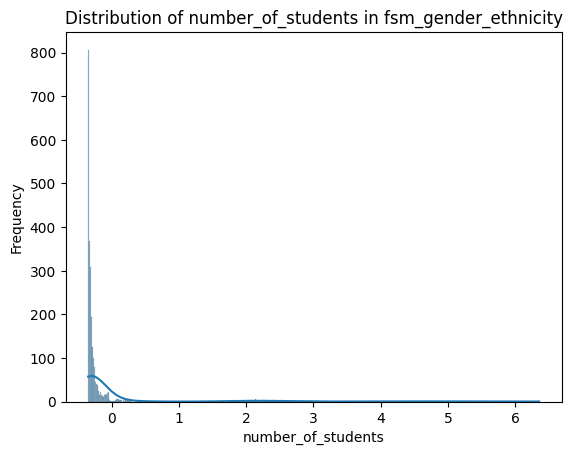

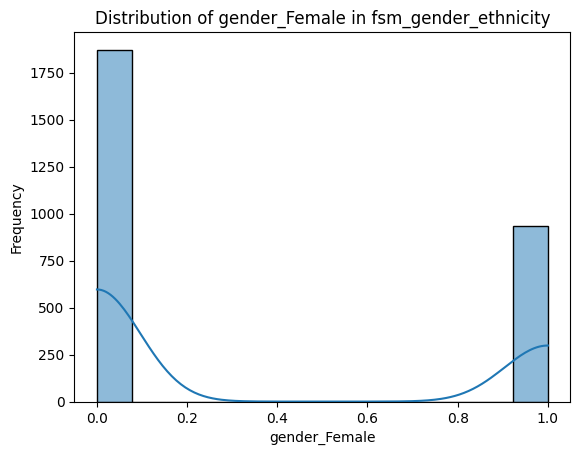

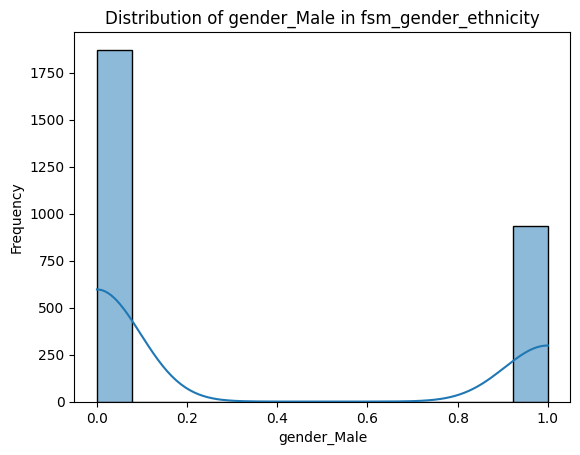

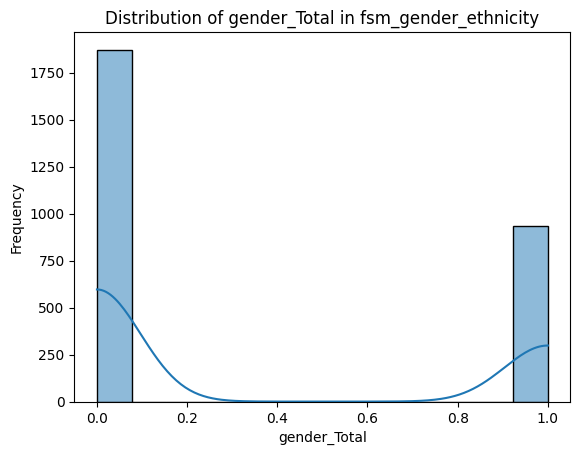

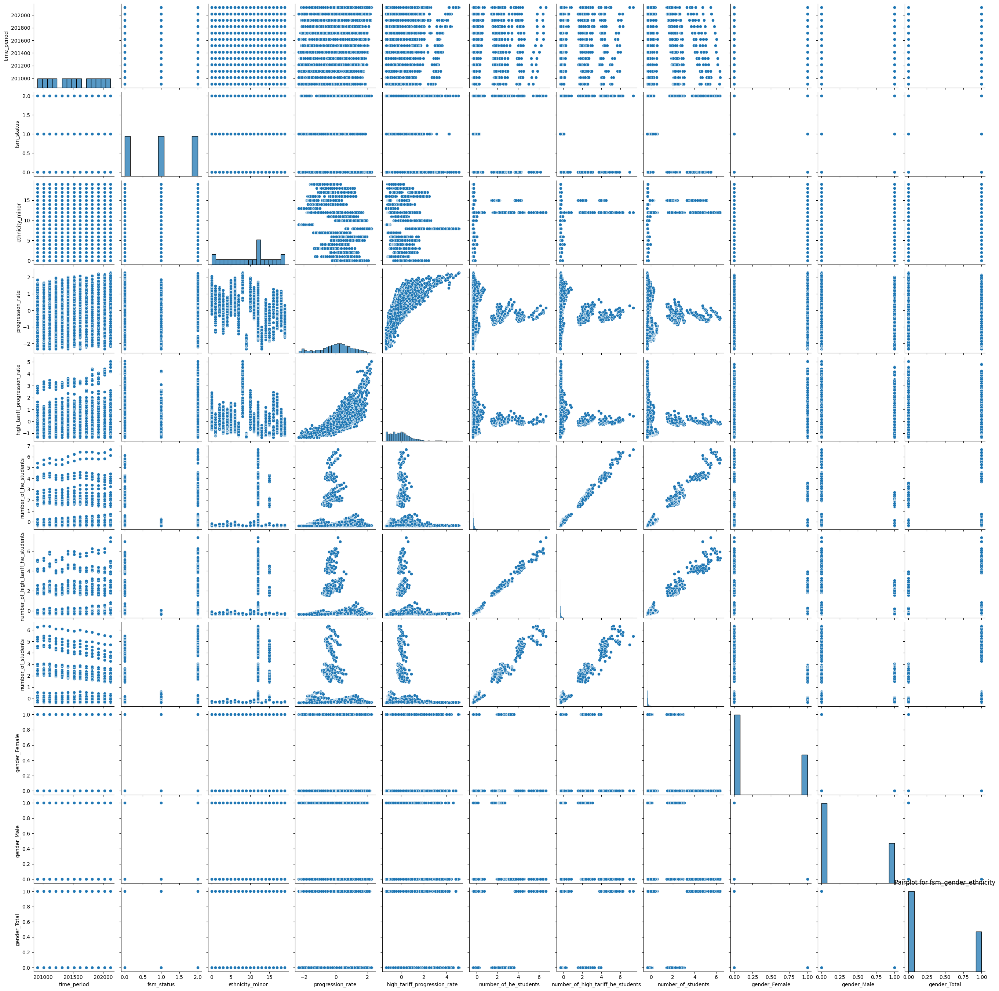

<ipython-input-31-f2ff2c5437dc>:27: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


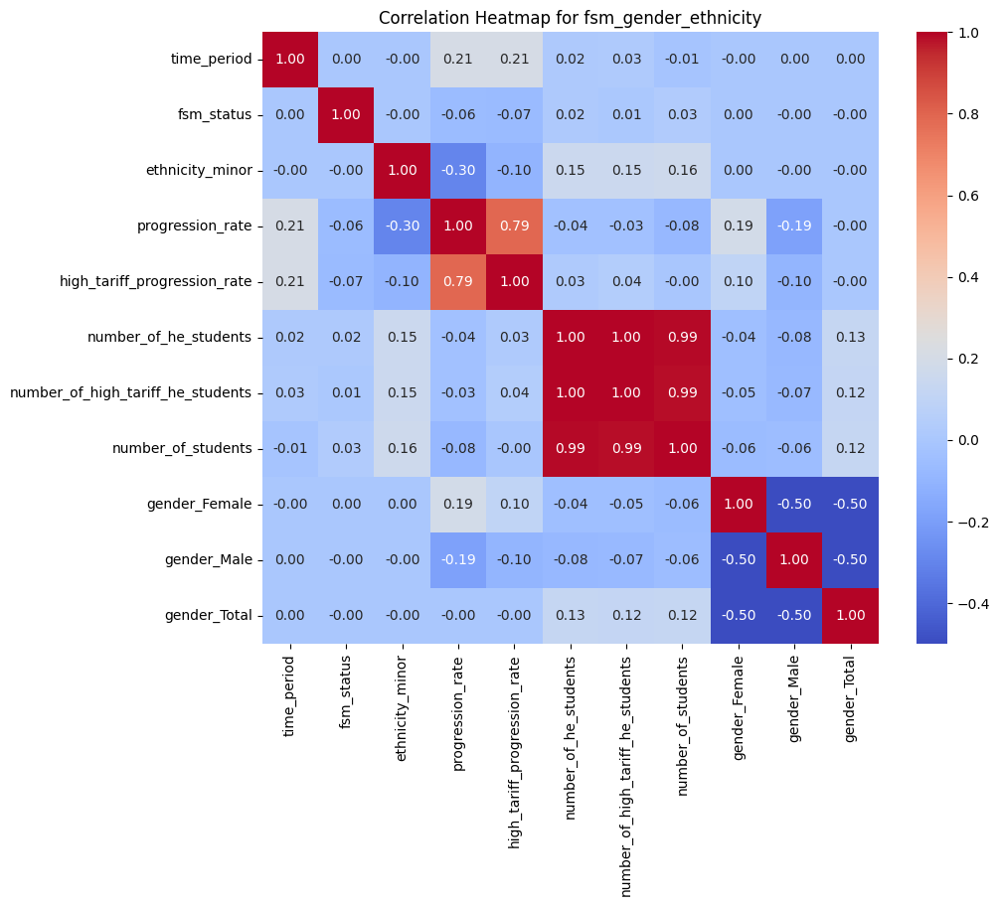

Exploratory Data Analysis for fsm_gender_ethnicity_region:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8418 entries, 0 to 8417
Data columns (total 17 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   time_period                        8418 non-null   int64  
 1   time_identifier                    8418 non-null   object 
 2   geographic_level                   8418 non-null   object 
 3   country_code                       8418 non-null   object 
 4   country_name                       8418 non-null   object 
 5   region_code                        8418 non-null   object 
 6   region_name                        8418 non-null   object 
 7   fsm_status                         8418 non-null   object 
 8   ethnicity_major                    8418 non-null   object 
 9   progression_rate                   8418 non-null   float64
 10  high_tariff_progression_rate       8418 non-null   float64
 1

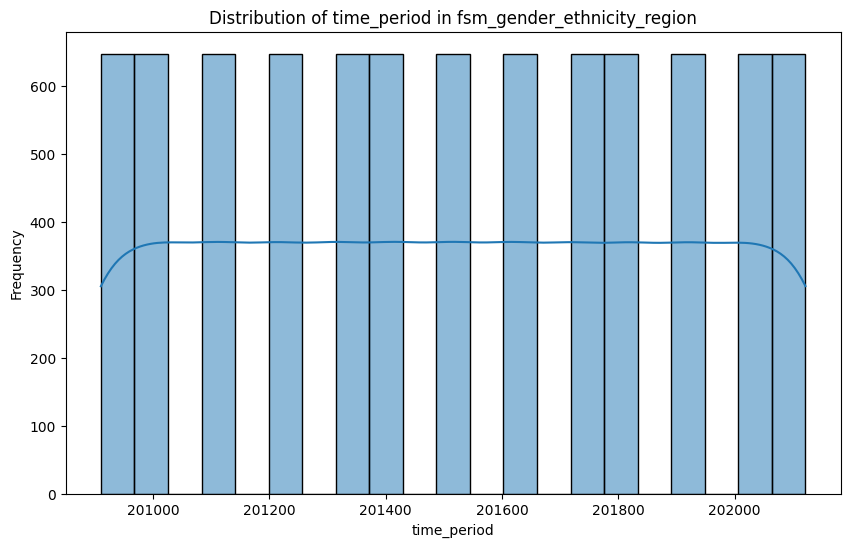

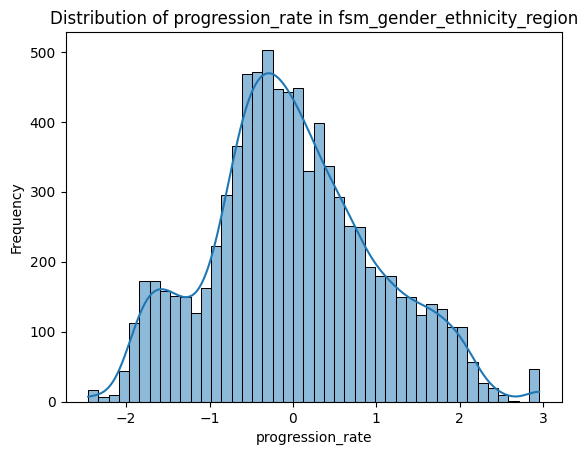

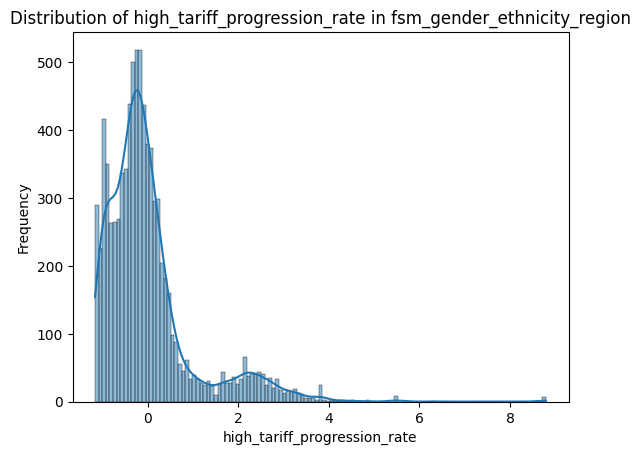

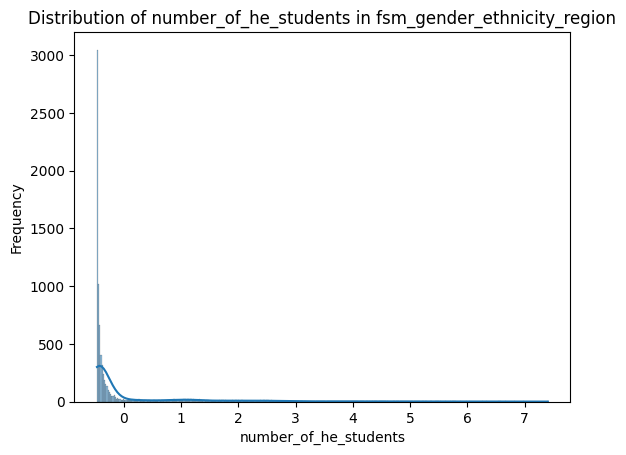

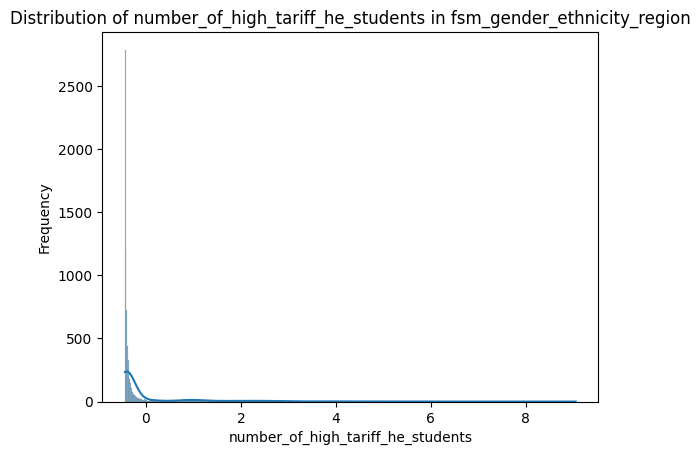

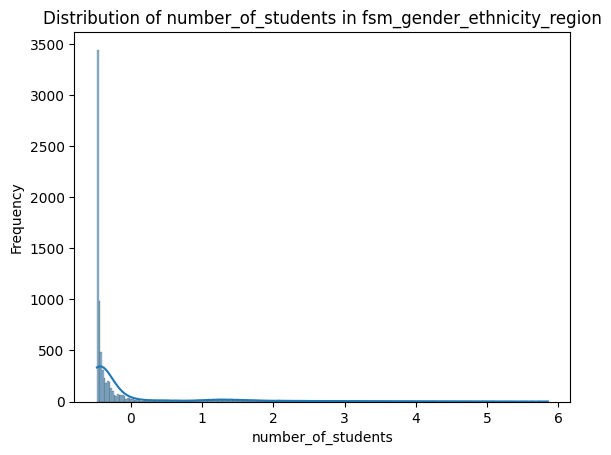

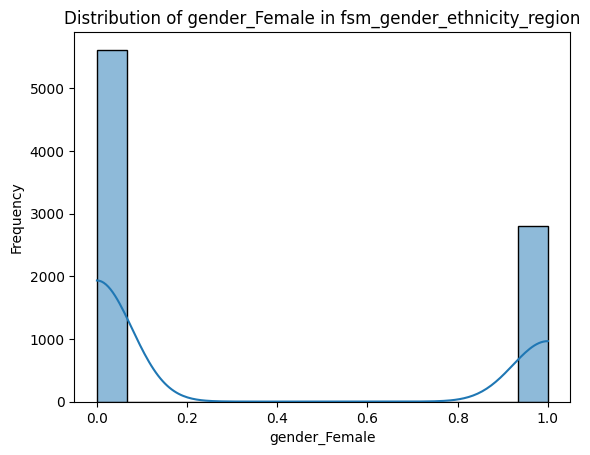

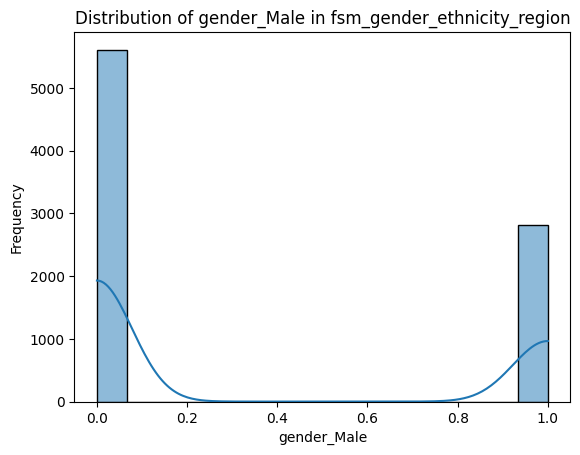

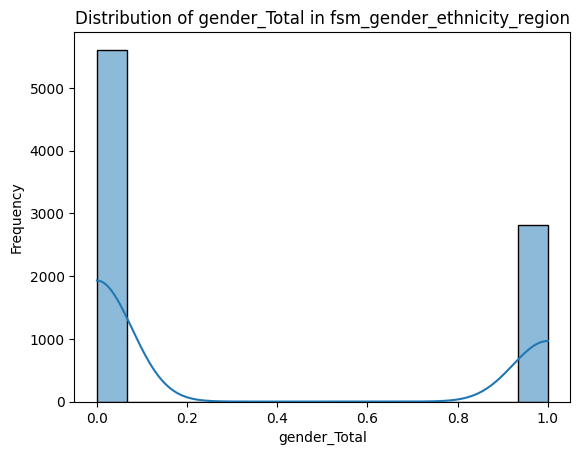

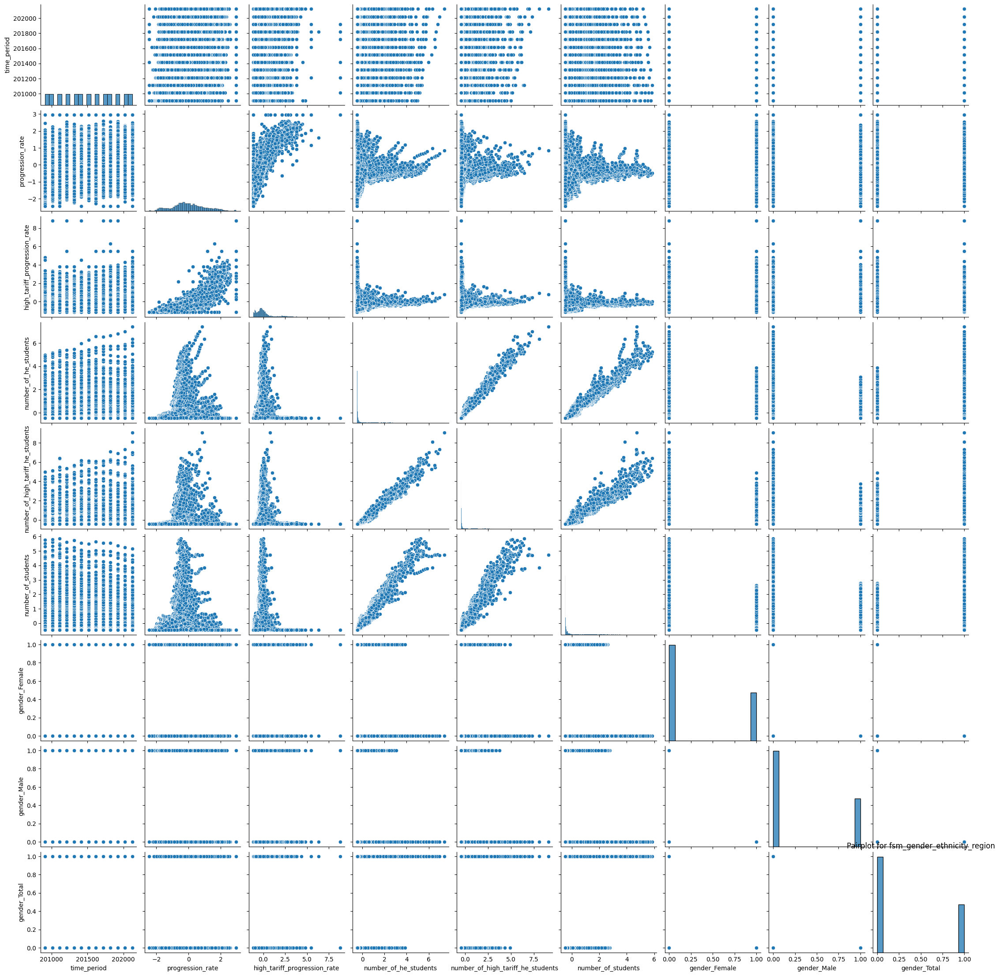

<ipython-input-31-f2ff2c5437dc>:27: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


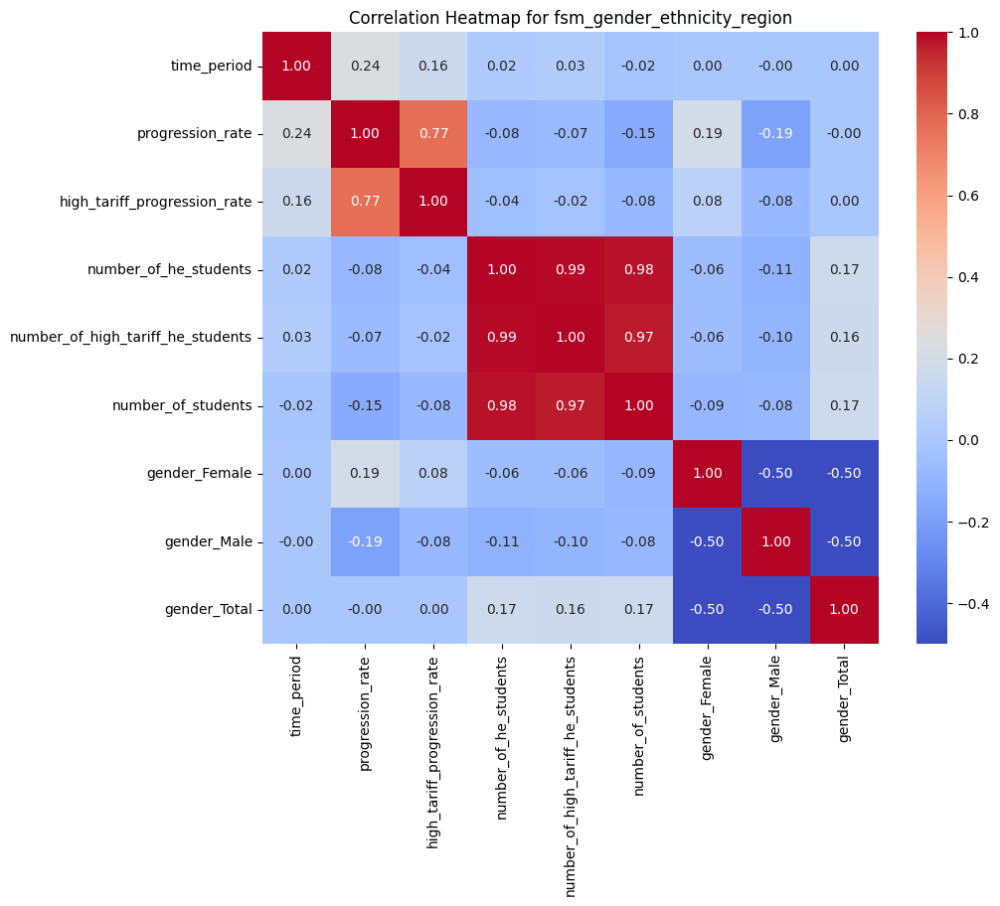

Exploratory Data Analysis for gender:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 6333 entries, 0 to 6332
Data columns (total 18 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   time_period                        6333 non-null   int64  
 1   time_identifier                    6333 non-null   object 
 2   geographic_level                   6333 non-null   object 
 3   country_code                       6333 non-null   object 
 4   country_name                       6333 non-null   object 
 5   region_code                        6294 non-null   object 
 6   region_name                        6294 non-null   object 
 7   old_la_code                        5865 non-null   float64
 8   new_la_code                        5841 non-null   object 
 9   la_name                            5865 non-null   object 
 10  progression_rate                   6333 non-null   float64
 11  high_tariff_progre

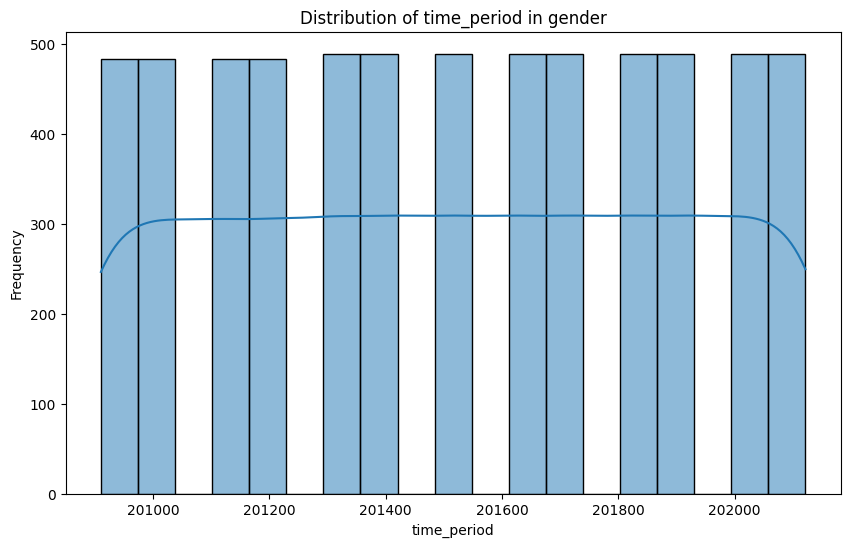

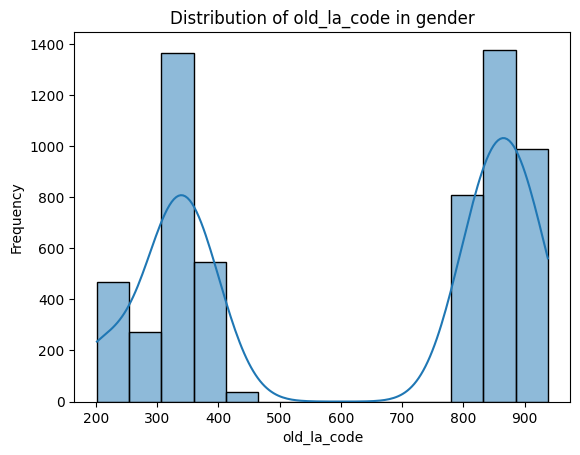

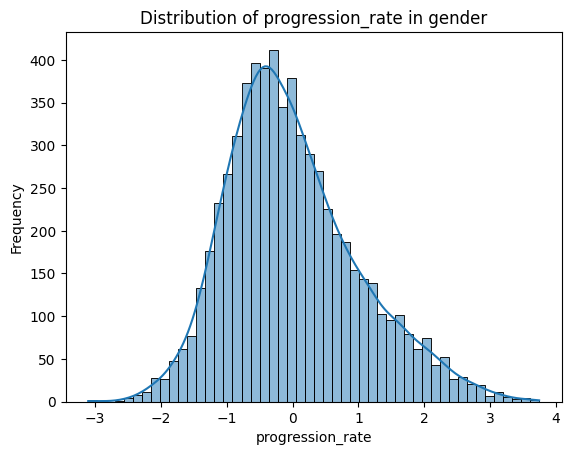

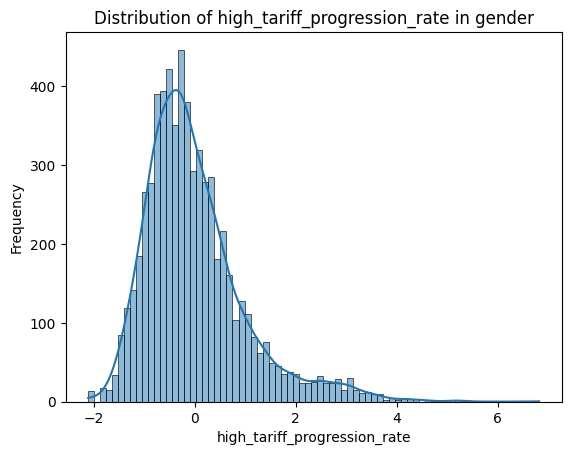

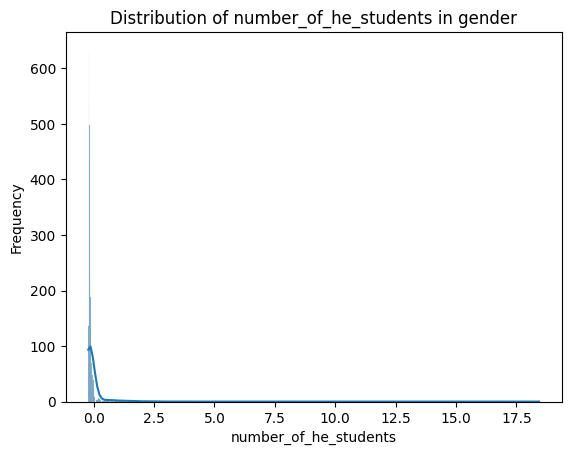

...

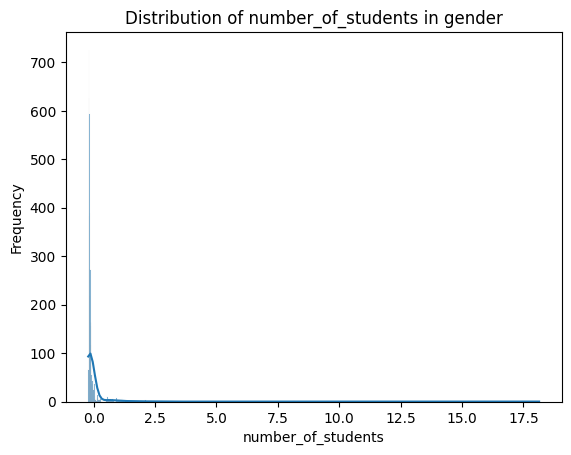

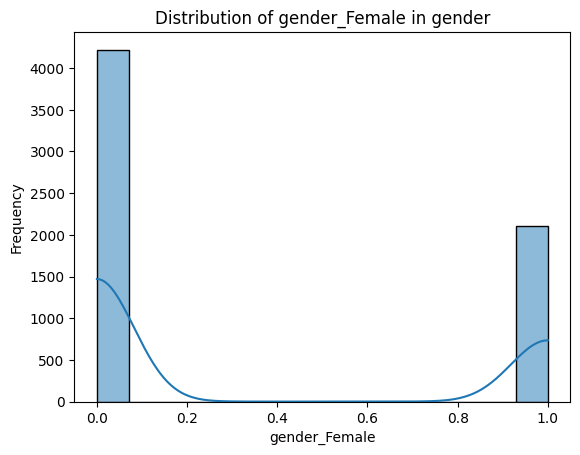

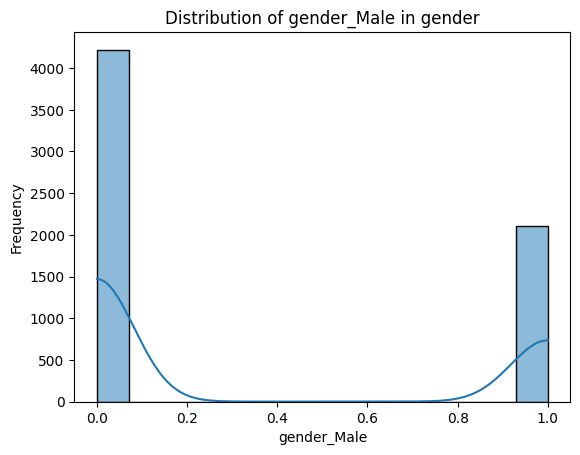

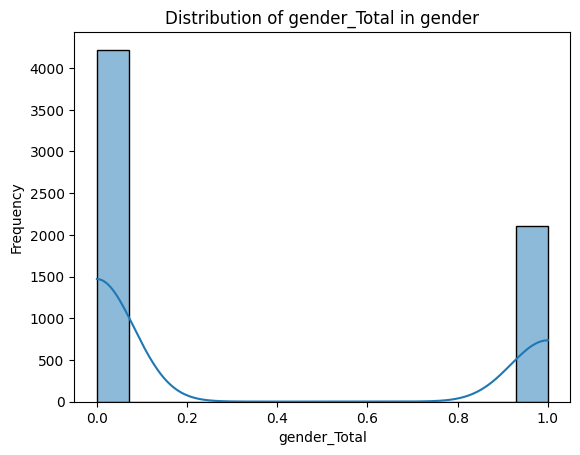

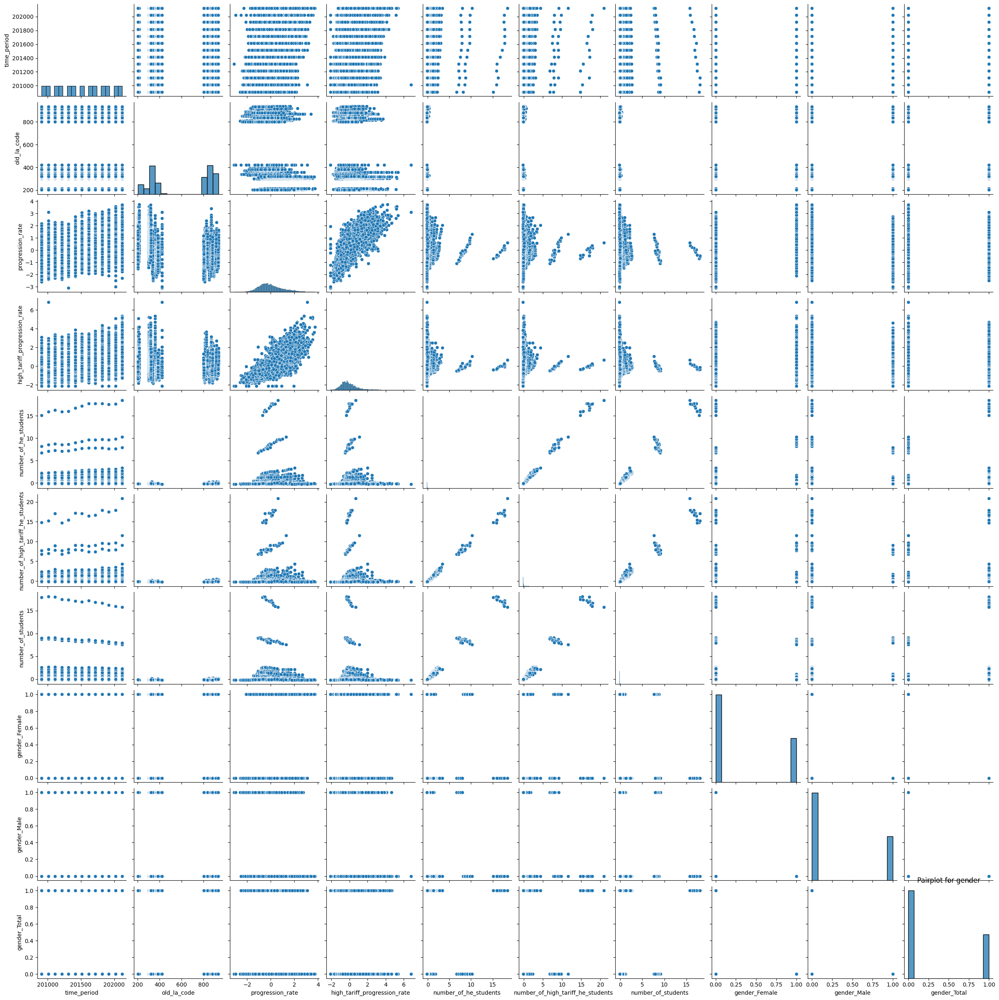

<ipython-input-31-f2ff2c5437dc>:27: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


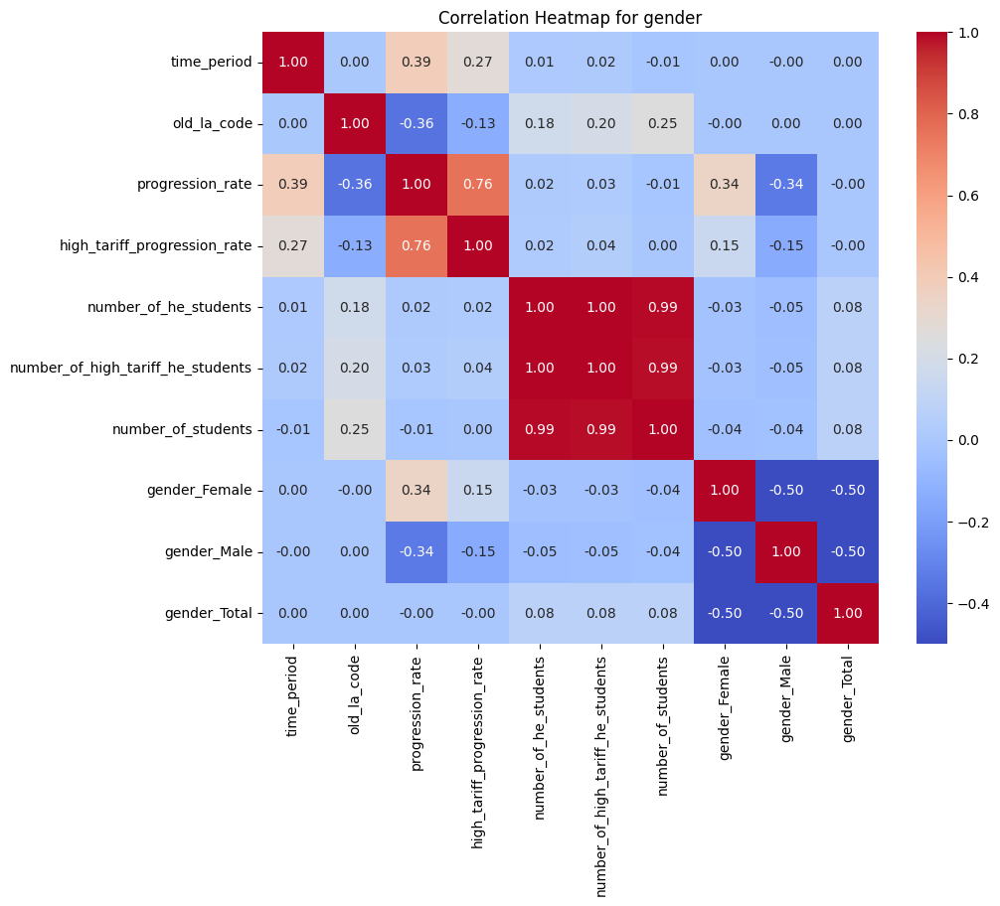

Exploratory Data Analysis for school_type:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 104 entries, 0 to 103
Data columns (total 13 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   time_period                        104 non-null    int64  
 1   time_identifier                    104 non-null    object 
 2   geographic_level                   104 non-null    object 
 3   country_code                       104 non-null    object 
 4   country_name                       104 non-null    object 
 5   school_type                        104 non-null    int64  
 6   progression_rate                   104 non-null    float64
 7   high_tariff_progression_rate       104 non-null    float64
 8   number_of_he_students              104 non-null    float64
 9   number_of_high_tariff_he_students  104 non-null    float64
 10  number_of_students                 104 non-null    float64
 11  a_level_status_

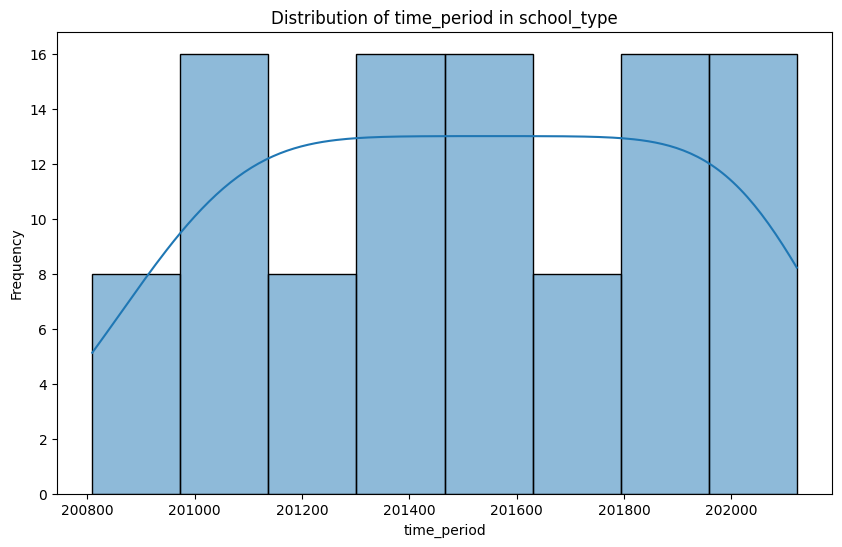

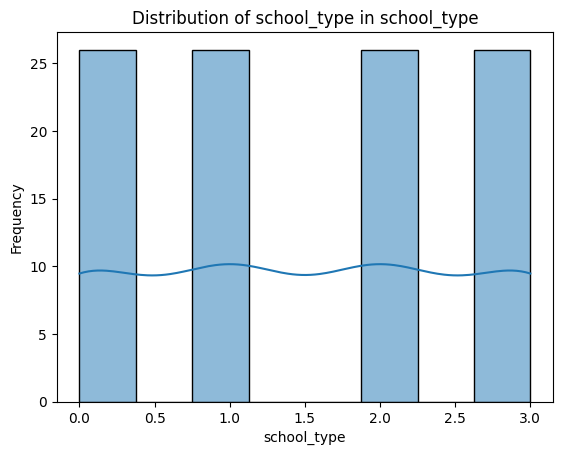

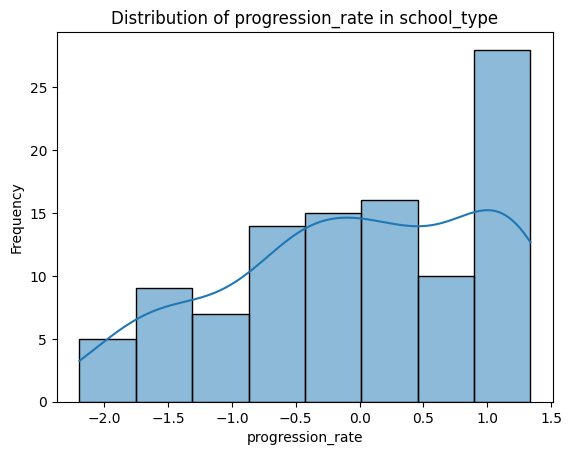

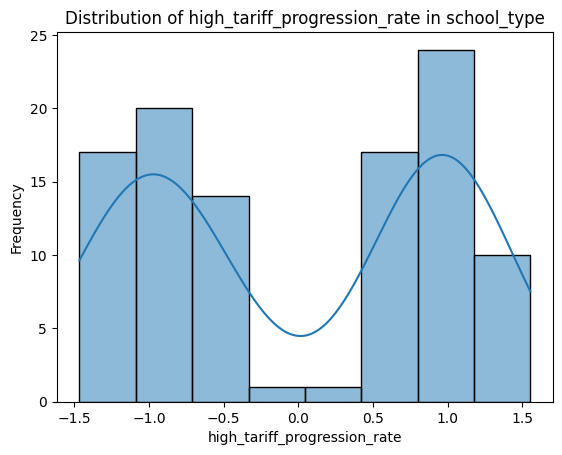

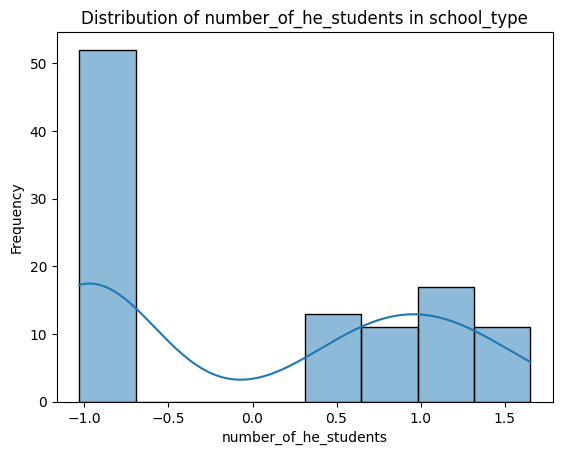

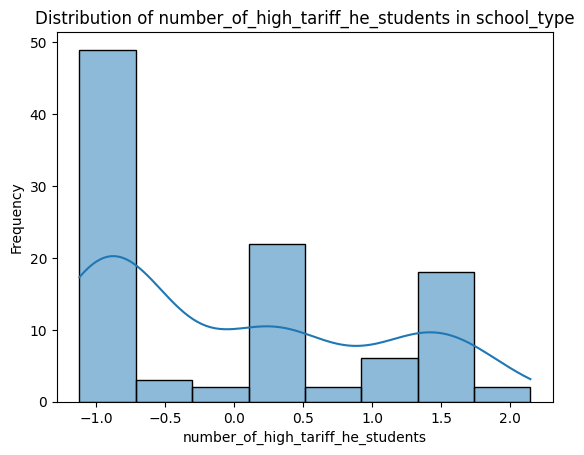

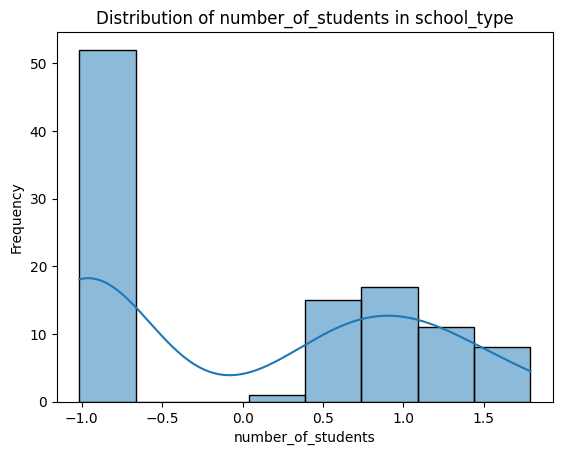

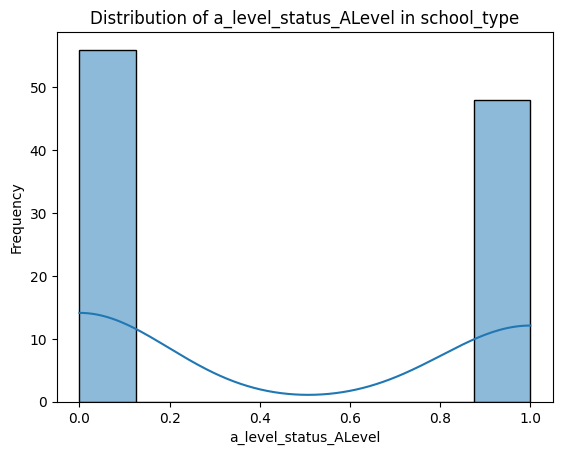

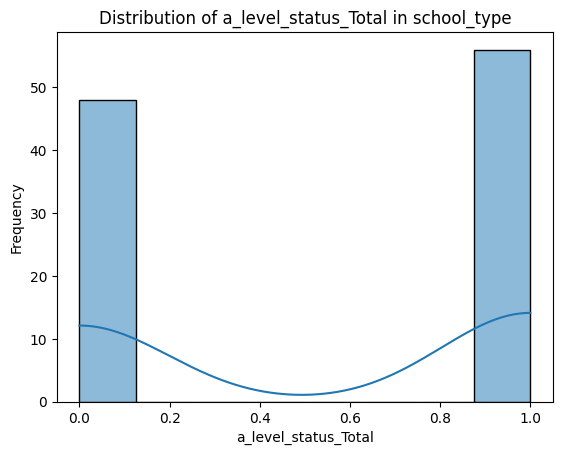

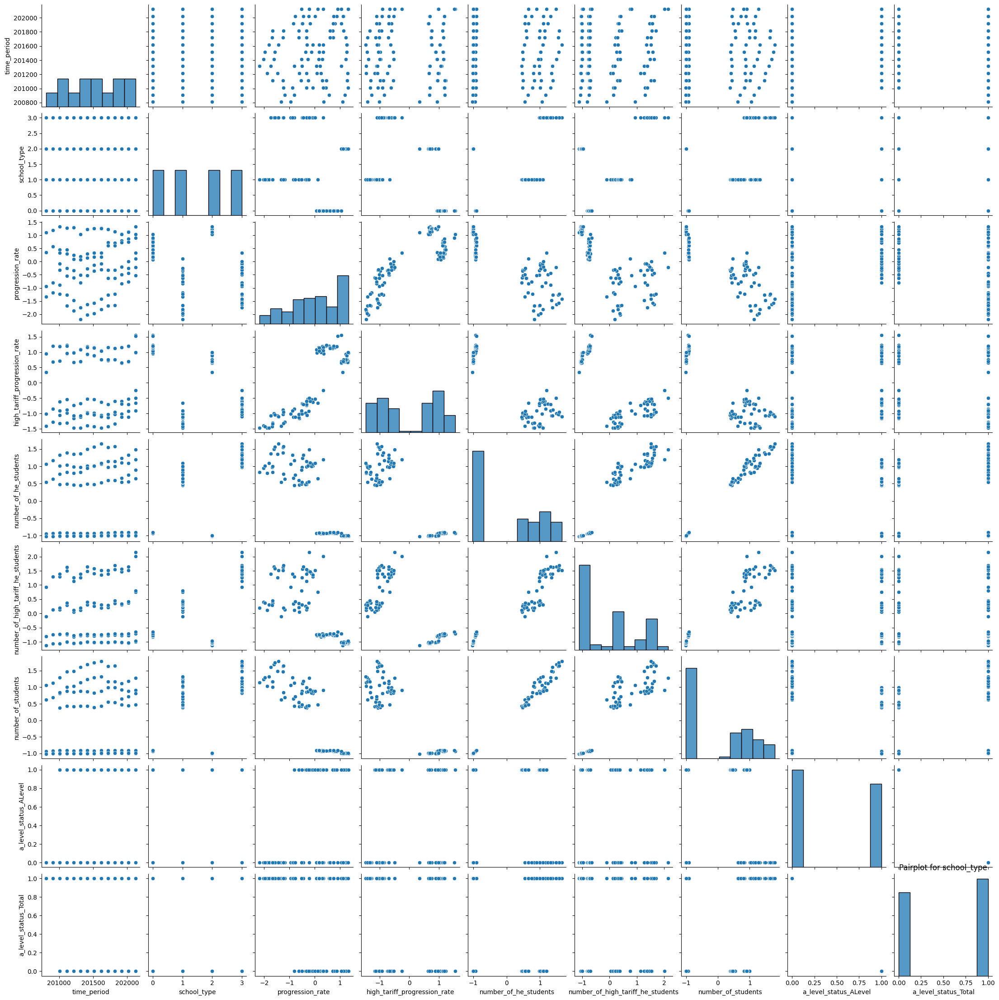

<ipython-input-31-f2ff2c5437dc>:27: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


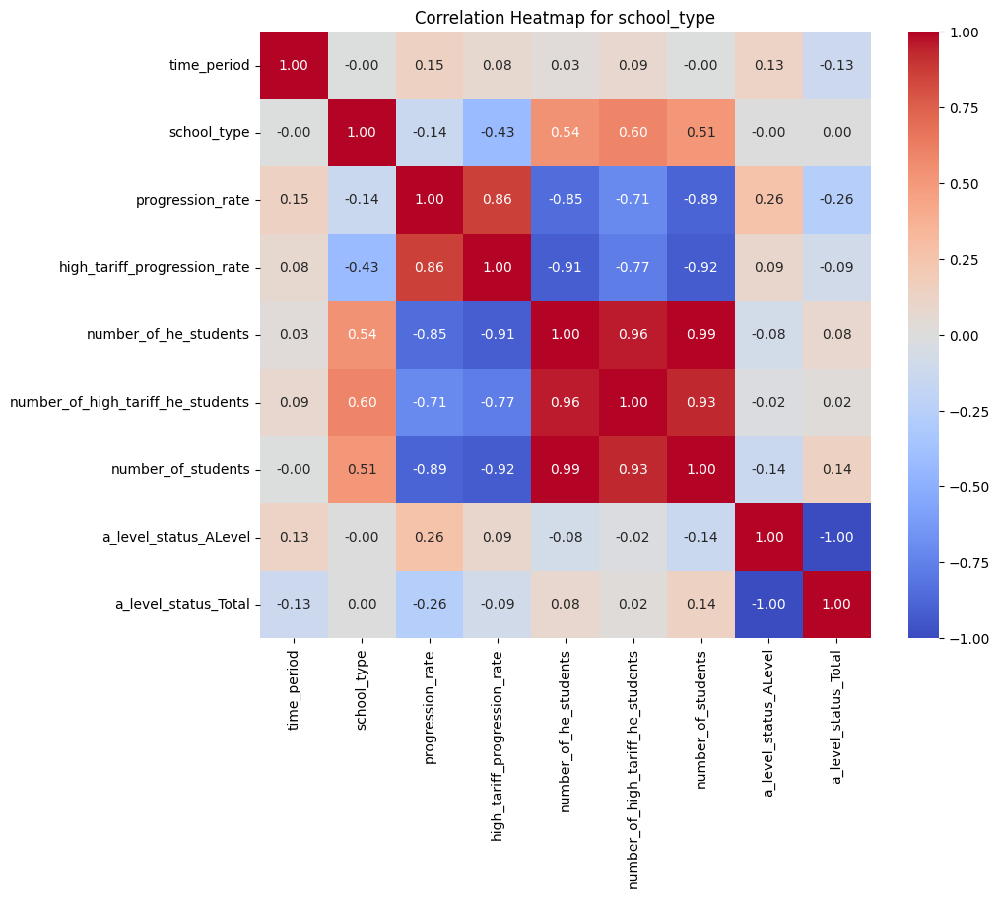

Exploratory Data Analysis for sen:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 6333 entries, 0 to 6332
Data columns (total 18 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   time_period                        6333 non-null   int64  
 1   time_identifier                    6333 non-null   object 
 2   geographic_level                   6333 non-null   object 
 3   country_code                       6333 non-null   object 
 4   country_name                       6333 non-null   object 
 5   region_code                        6294 non-null   object 
 6   region_name                        6294 non-null   object 
 7   old_la_code                        5865 non-null   float64
 8   new_la_code                        5841 non-null   object 
 9   la_name                            5865 non-null   object 
 10  progression_rate                   6333 non-null   float64
 11  high_tariff_progressi

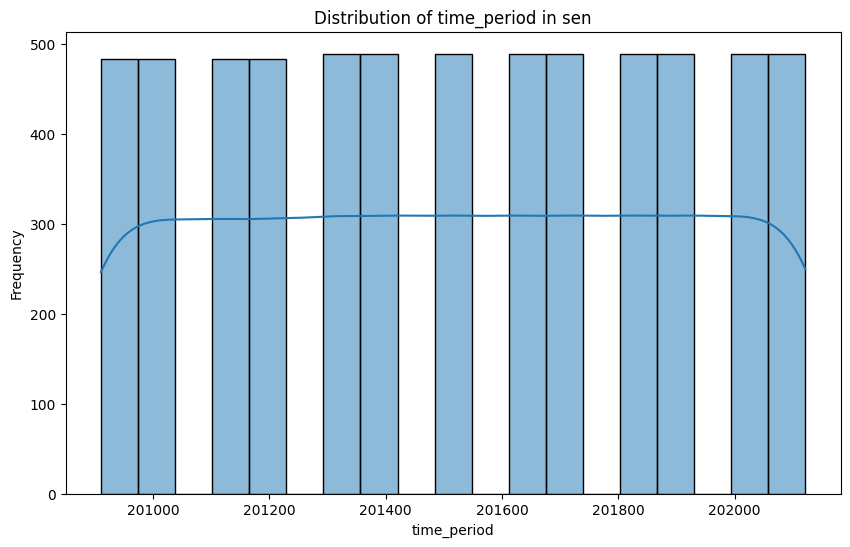

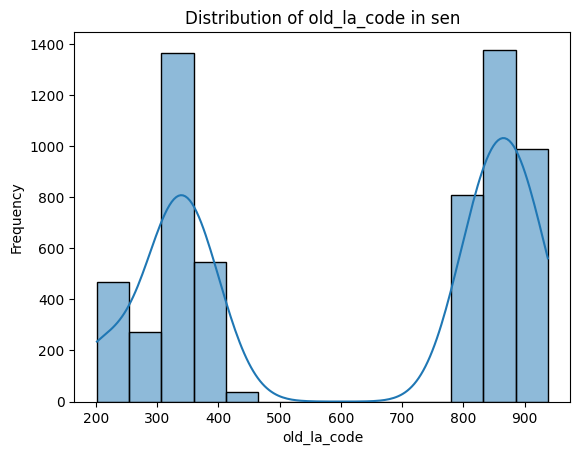

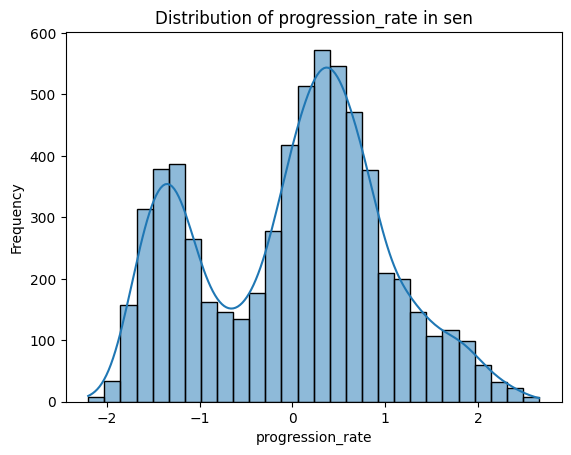

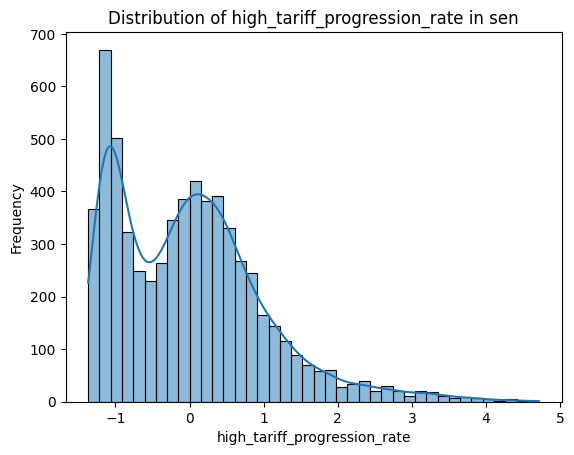

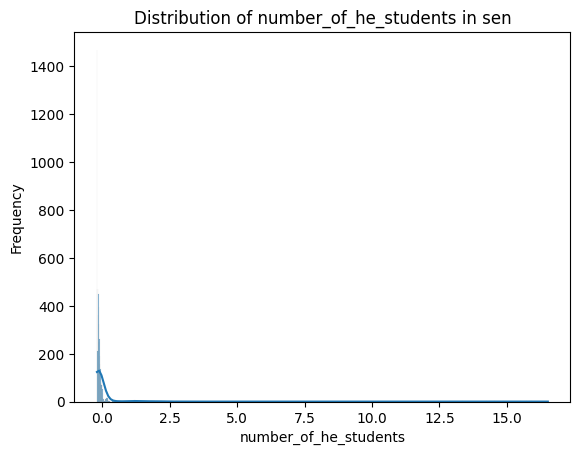

...

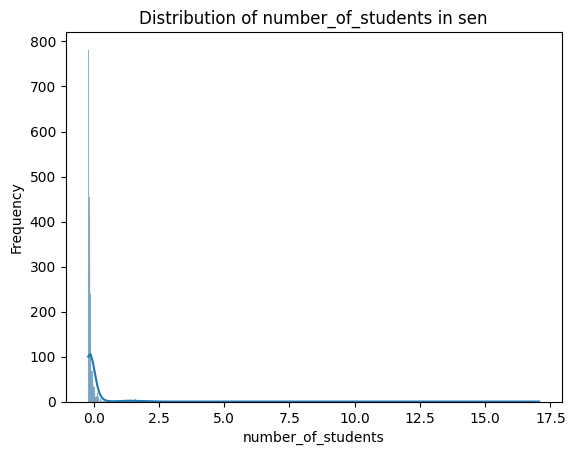

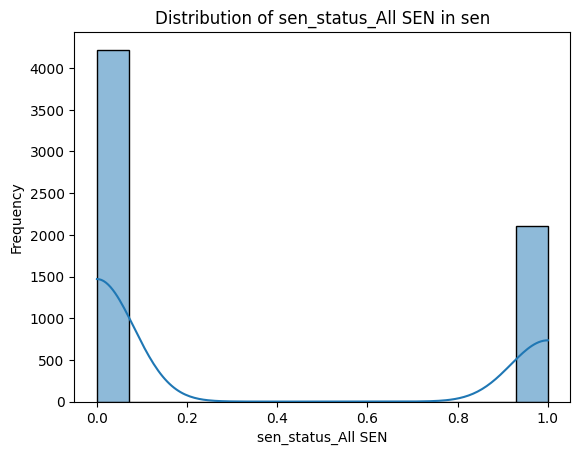

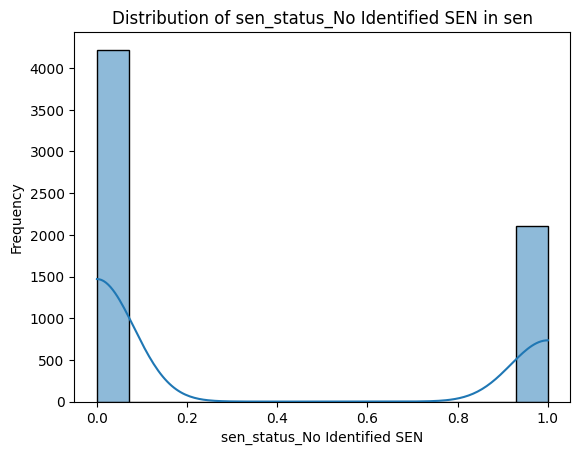

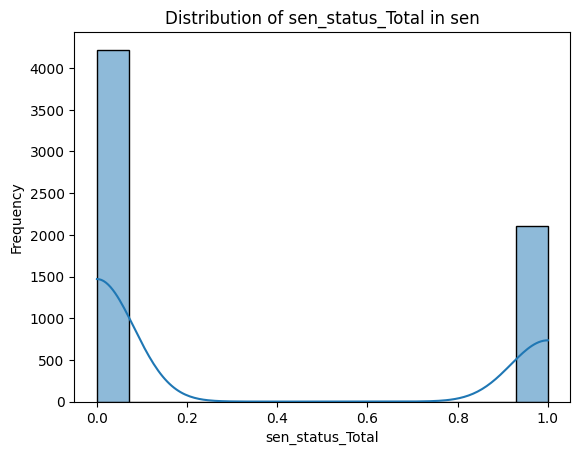

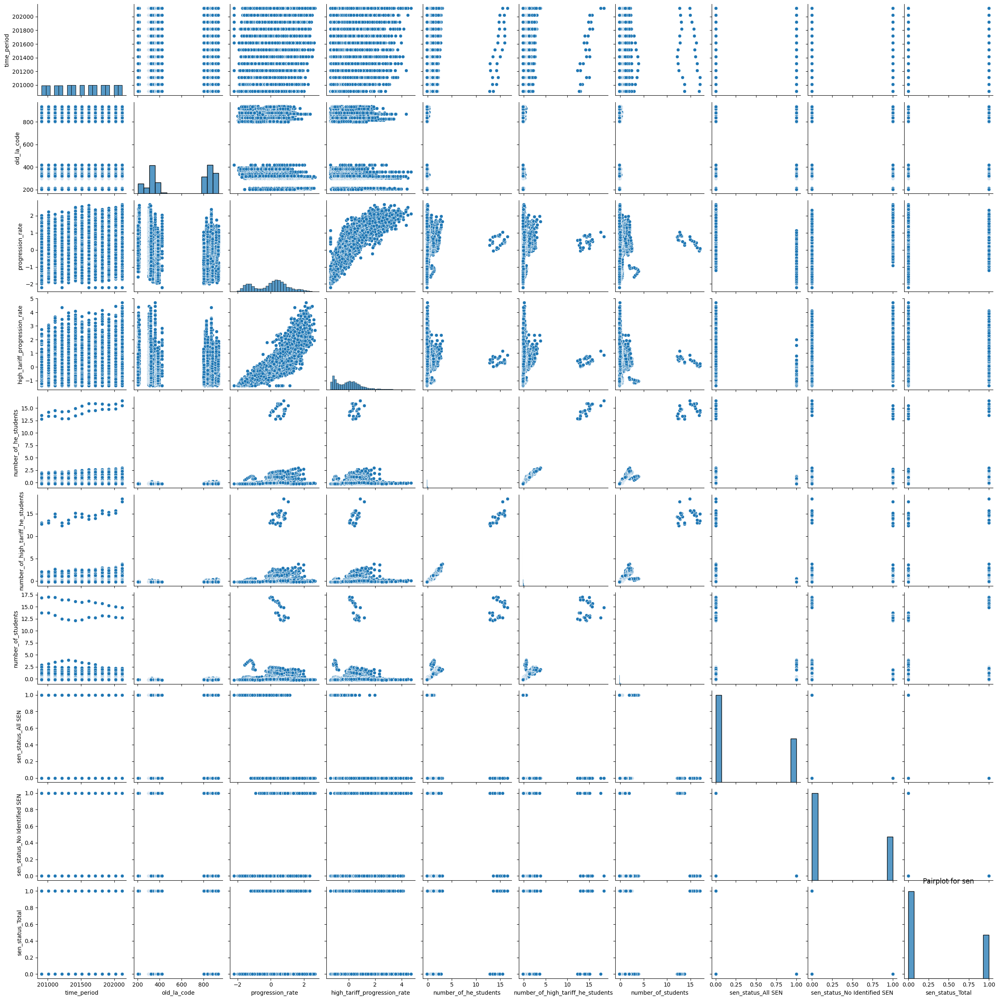

<ipython-input-31-f2ff2c5437dc>:27: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


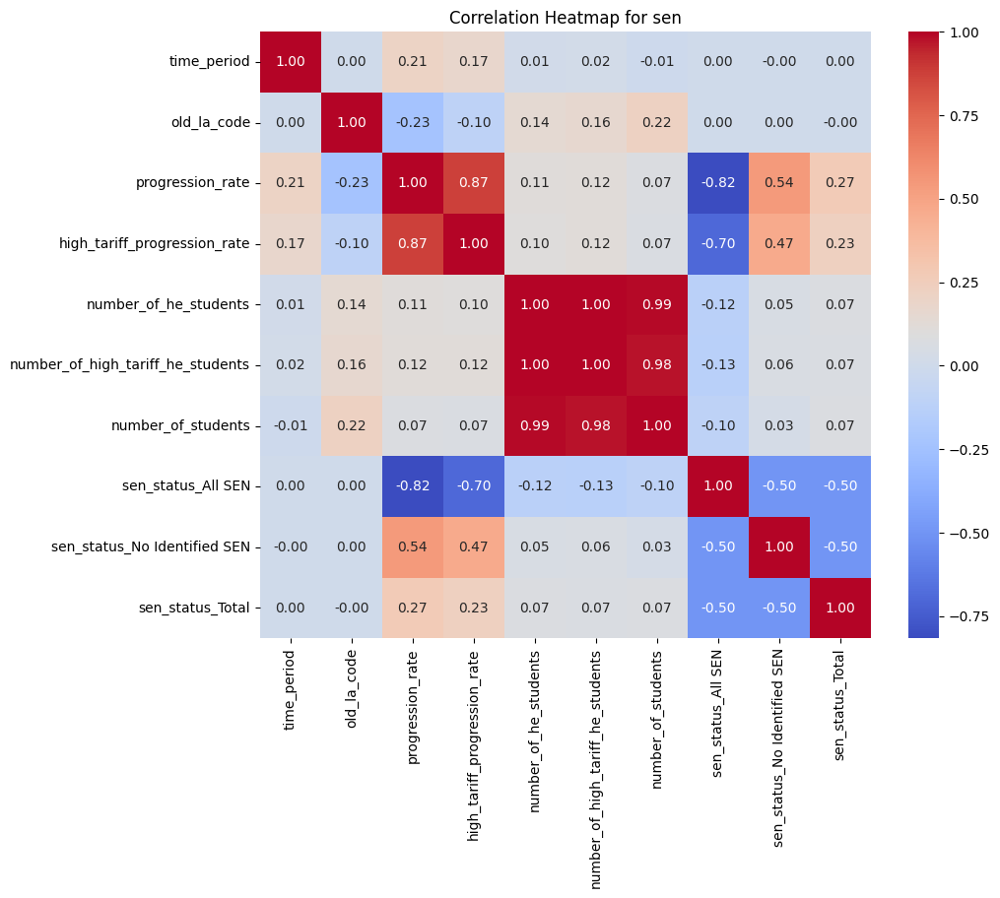

Exploratory Data Analysis for tariff_group:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2634 entries, 0 to 2633
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   time_period       2634 non-null   int64 
 1   time_identifier   2634 non-null   object
 2   geographic_level  2634 non-null   object
 3   country_code      2634 non-null   object
 4   country_name      2634 non-null   object
 5   provider_ukprn    2634 non-null   int64 
 6   provider_name     2634 non-null   object
 7   tariff_grouping   2634 non-null   int64 
 8   mean_tariff       2634 non-null   object
dtypes: int64(3), object(6)
memory usage: 205.8+ KB
None
         time_period  provider_ukprn  tariff_grouping
count    2634.000000    2.634000e+03      2634.000000
mean   201521.483295    1.000898e+07         1.303341
std       398.035389    9.526825e+03         0.950869
min    200809.000000    1.000008e+07         0.000000
25%    201213.000

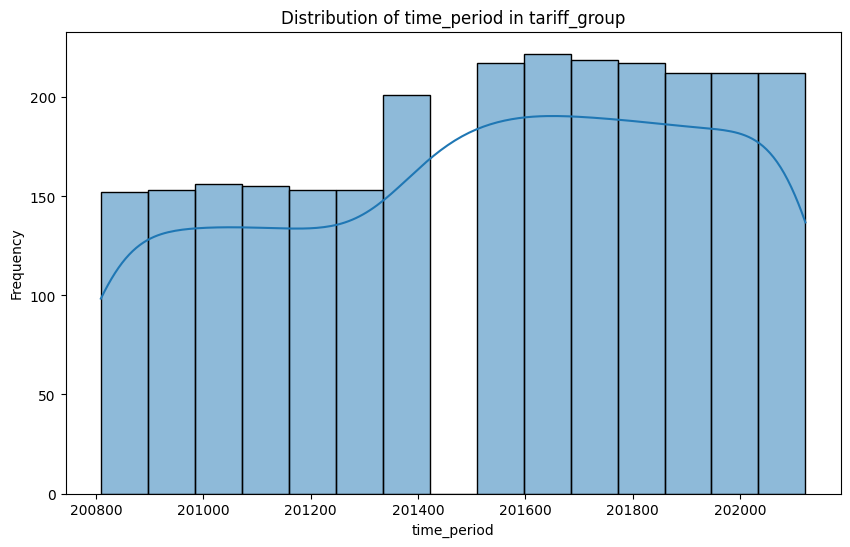

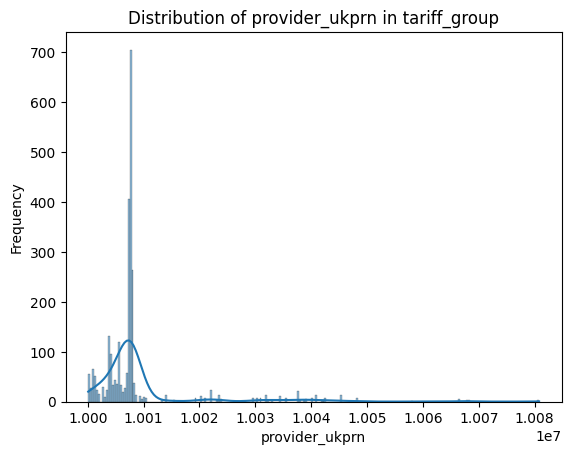

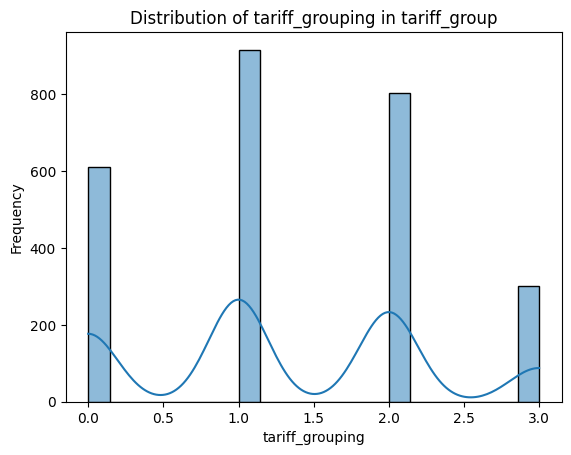

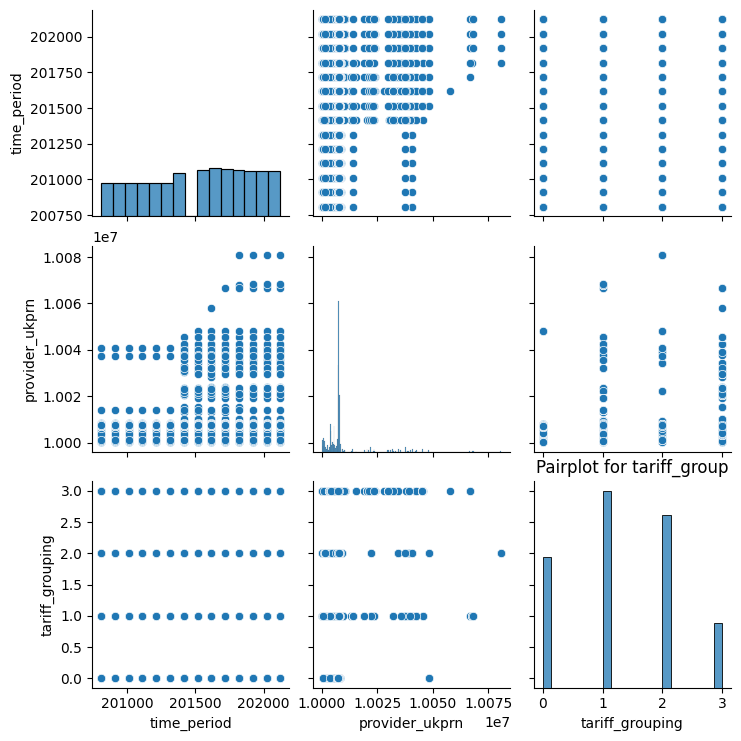

<ipython-input-31-f2ff2c5437dc>:27: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


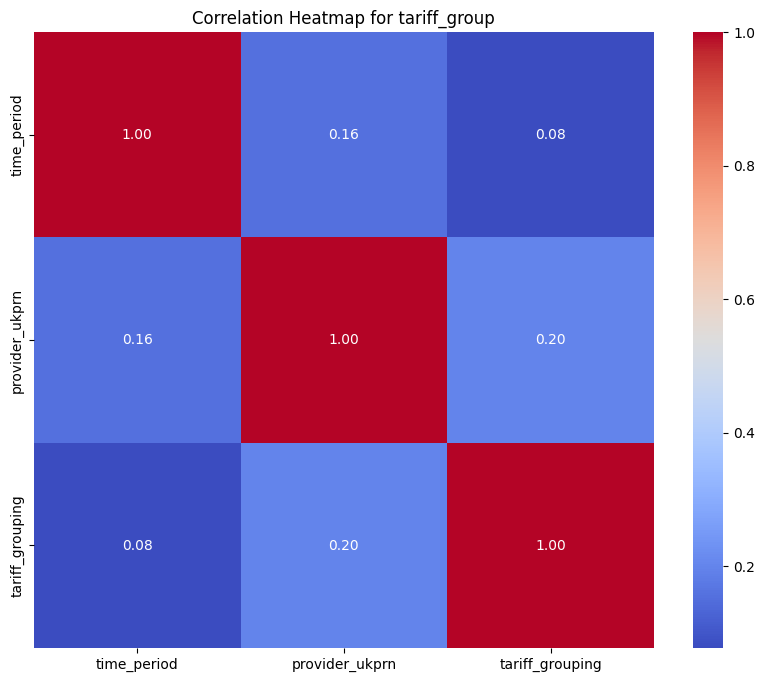

Exploratory Data Analysis for tef:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 19
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   time_period             20 non-null     int64  
 1   time_identifier         20 non-null     object 
 2   geographic_level        20 non-null     object 
 3   country_code            20 non-null     object 
 4   country_name            20 non-null     object 
 5   school_type             20 non-null     object 
 6   tef_rating              20 non-null     int64  
 7   number_of_he_students   20 non-null     float64
 8   progression_rate        20 non-null     float64
 9   percentage_he_students  20 non-null     float64
dtypes: float64(3), int64(2), object(5)
memory usage: 1.7+ KB
None
       time_period  tef_rating  number_of_he_students  progression_rate  \
count         20.0   20.000000           2.000000e+01      2.000000e+01   
mean     

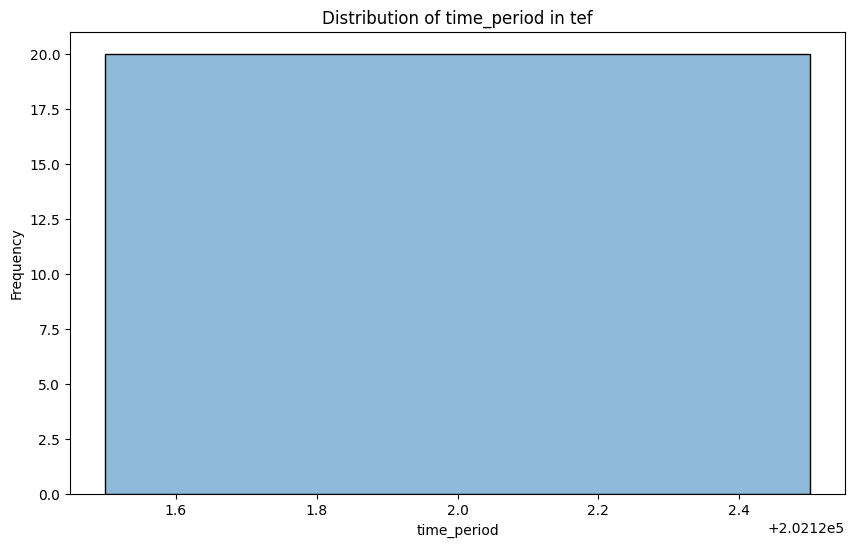

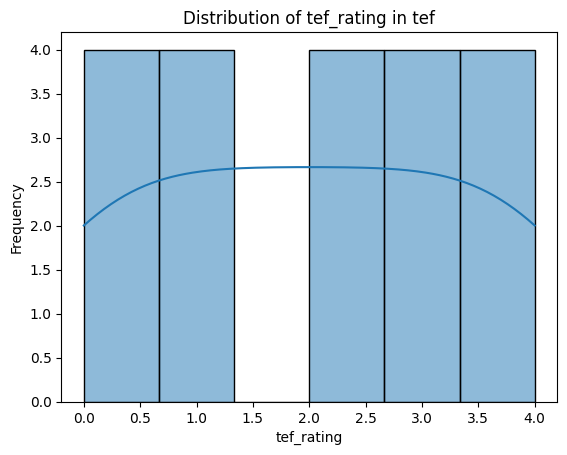

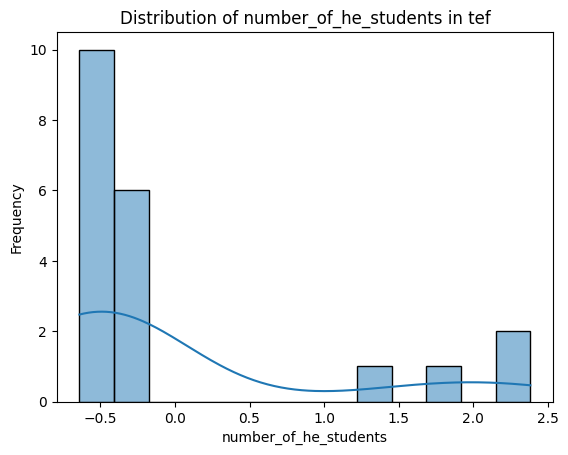

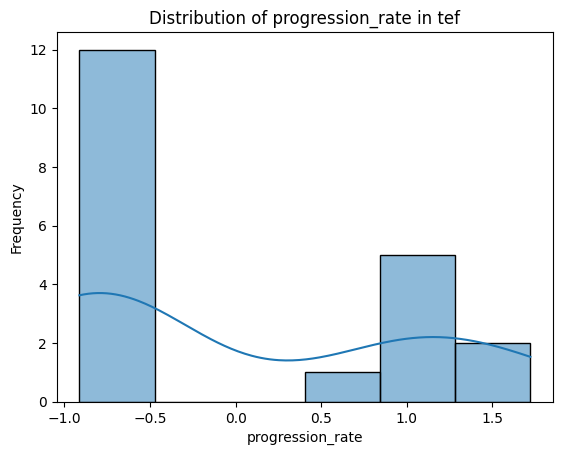

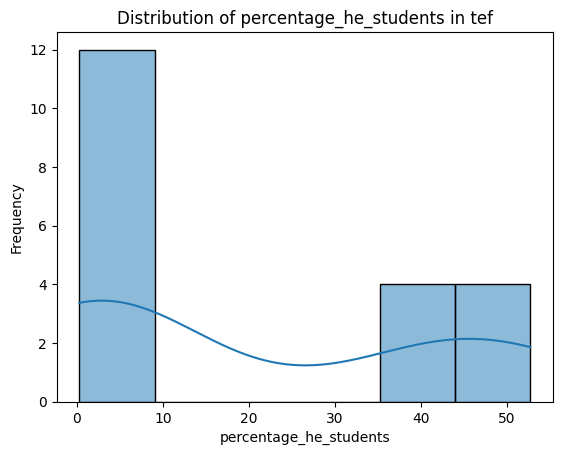

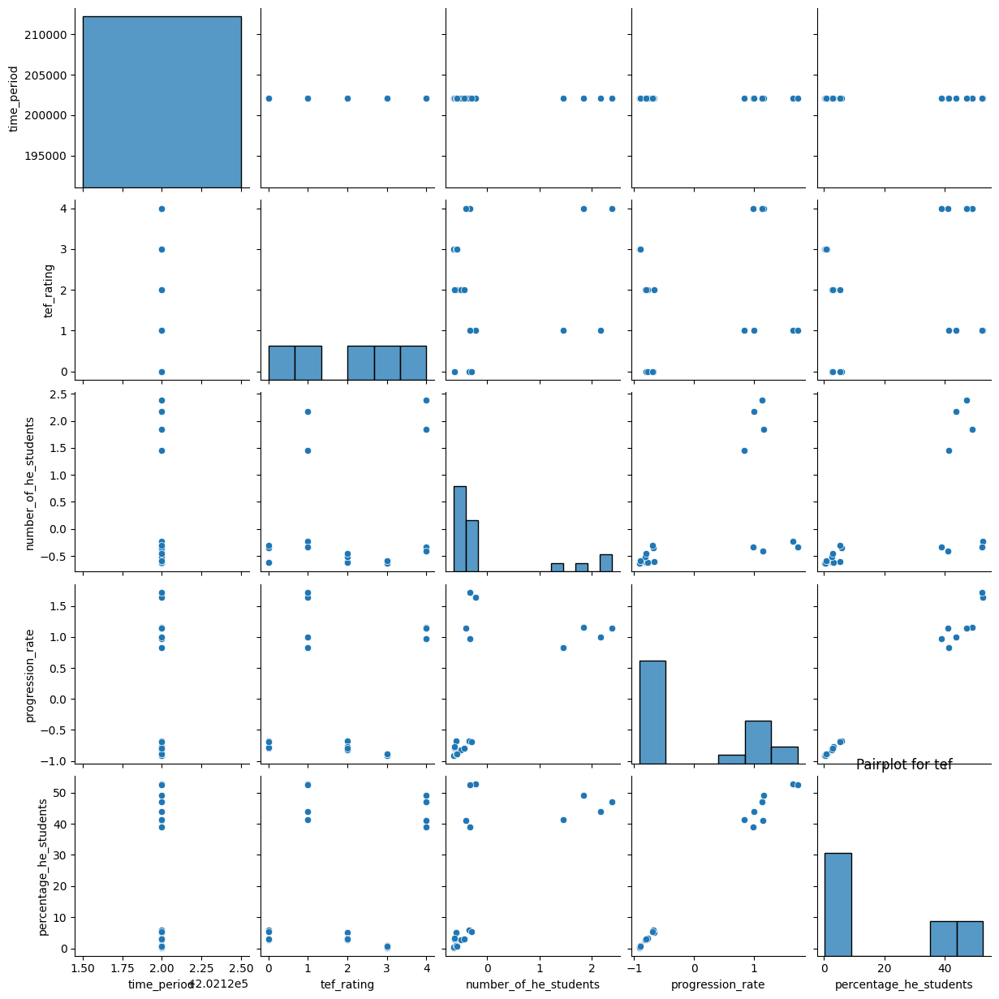

<ipython-input-31-f2ff2c5437dc>:27: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


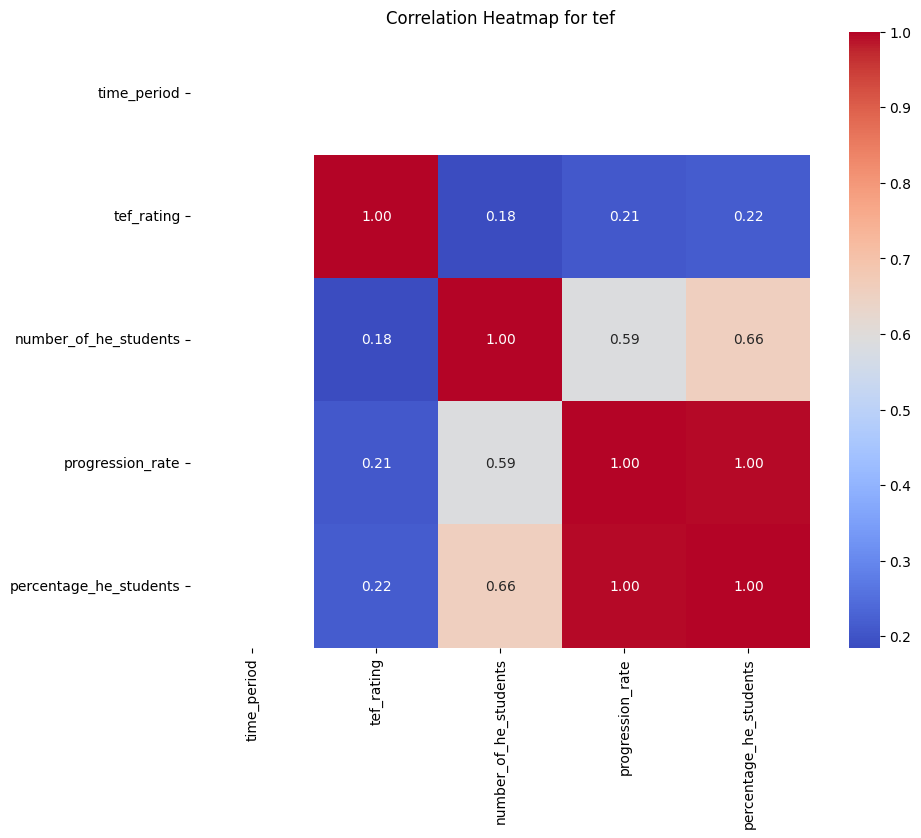

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# EDA for each dataset
for key, df in data.items():
    print(f"Exploratory Data Analysis for {key}:")
    print(df.info())  # Basic info about the dataset
    print(df.describe())  # Summary statistics
    print(df.head())  # Display the first few rows

    # Visualizing distribution of numerical columns
    numerical_cols = df.select_dtypes(include='number').columns.tolist()
    plt.figure(figsize=(10, 6))
    for col in numerical_cols:
        sns.histplot(df[col], kde=True)
        plt.title(f'Distribution of {col} in {key}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.show()

    # Visualizing relationships between variables (if applicable)
    sns.pairplot(df)  # Pairplot for numerical columns
    plt.title(f'Pairplot for {key}')
    plt.show()

    # Correlation heatmap for numerical columns
    corr_matrix = df.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title(f'Correlation Heatmap for {key}')
    plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.impute import SimpleImputer

# Define the models
regression_models = {
    'RandomForestRegressor': RandomForestRegressor(),
    'LinearRegression': LinearRegression()
}

classification_models = {
    'LogisticRegression': LogisticRegression(),
    'SVC': SVC(),
    'KNeighborsClassifier': KNeighborsClassifier(),
    'DecisionTreeClassifier': DecisionTreeClassifier(),
    'RandomForestClassifier': RandomForestClassifier(),
    'NaiveBayes': GaussianNB()
}

# Initialize results dictionary
results = {model_name: {} for model_name in regression_models.keys()}
results.update({model_name: {} for model_name in classification_models.keys()})

# Data preprocessing and model training for regression models
target_variable = 'progression_rate'  # Change this to the actual target variable
for key, df in data.items():
    if target_variable in df.columns:
        df.dropna(subset=[target_variable], inplace=True)
        # Check for missing values
        if df.isnull().values.any():
            # Impute missing values
            numerical_cols = df.select_dtypes(include='number').columns.tolist()
            imputer = SimpleImputer(strategy='mean')  # You can adjust the strategy as needed
            df[numerical_cols] = imputer.fit_transform(df[numerical_cols])

        for col in df.select_dtypes(include='object').columns:
            le = LabelEncoder()
            df[col] = le.fit_transform(df[col])

        X = df.drop(columns=[target_variable])
        y = df[target_variable]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        for model_name, model in regression_models.items():
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            mse = mean_squared_error(y_test, y_pred)
            results[model_name][key] = mse

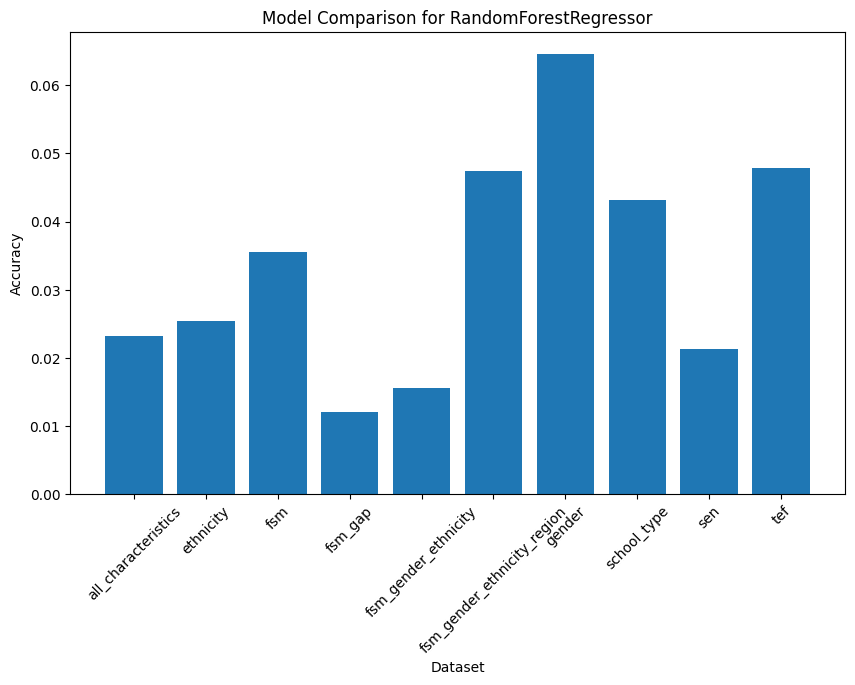

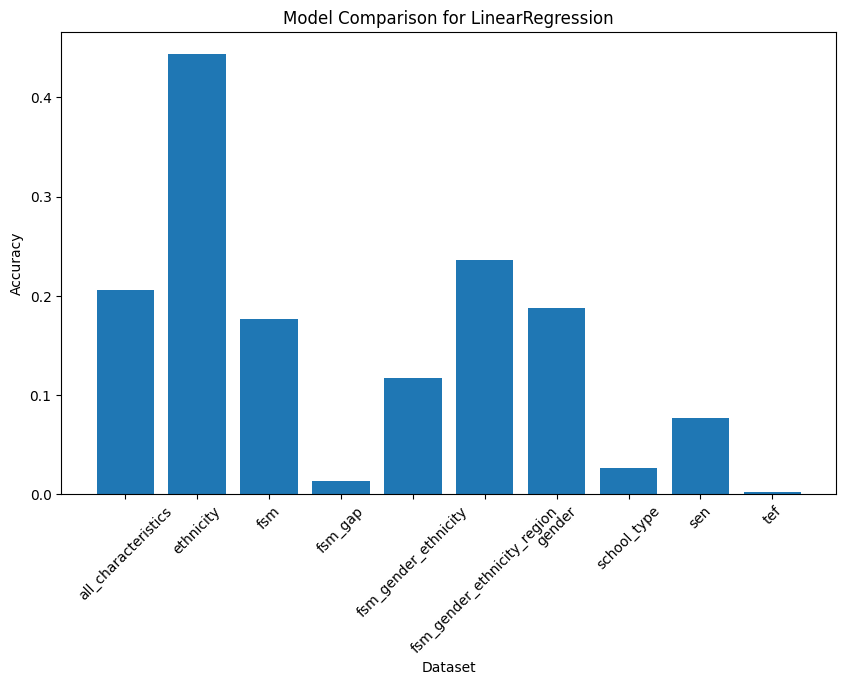

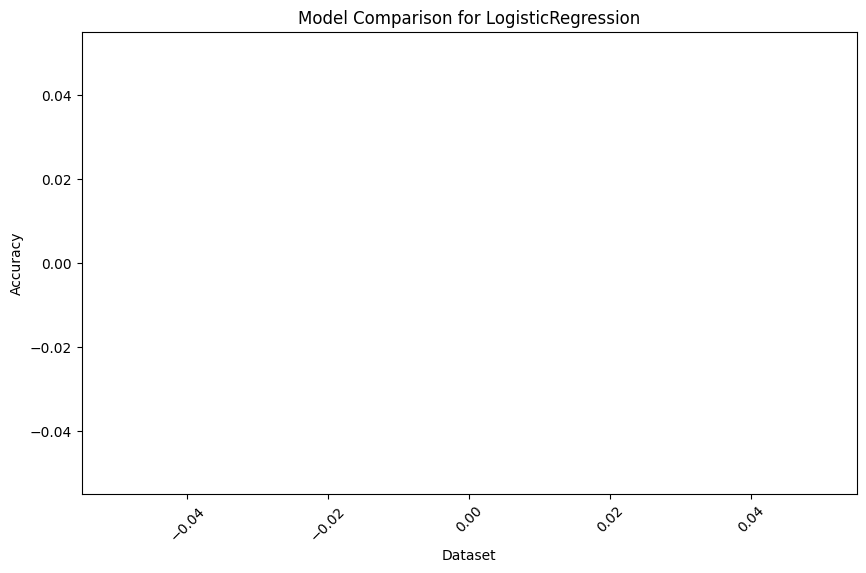

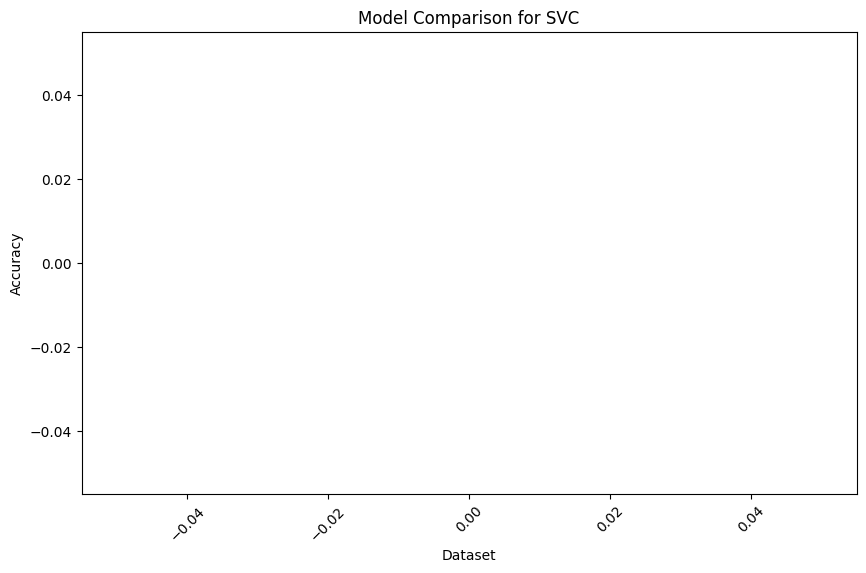

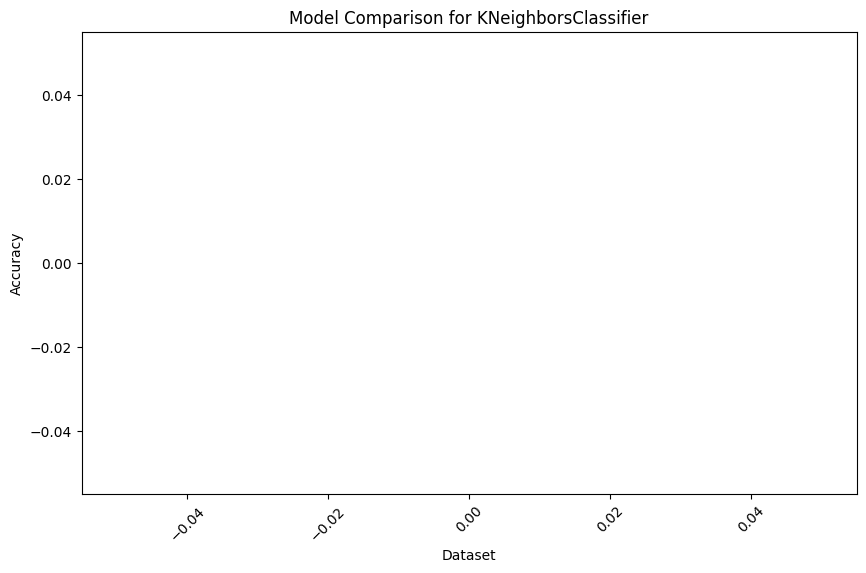

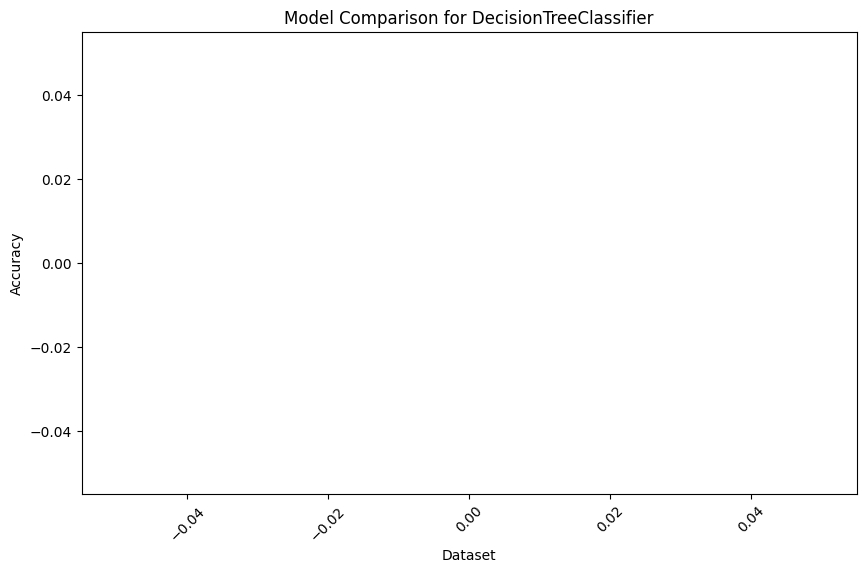

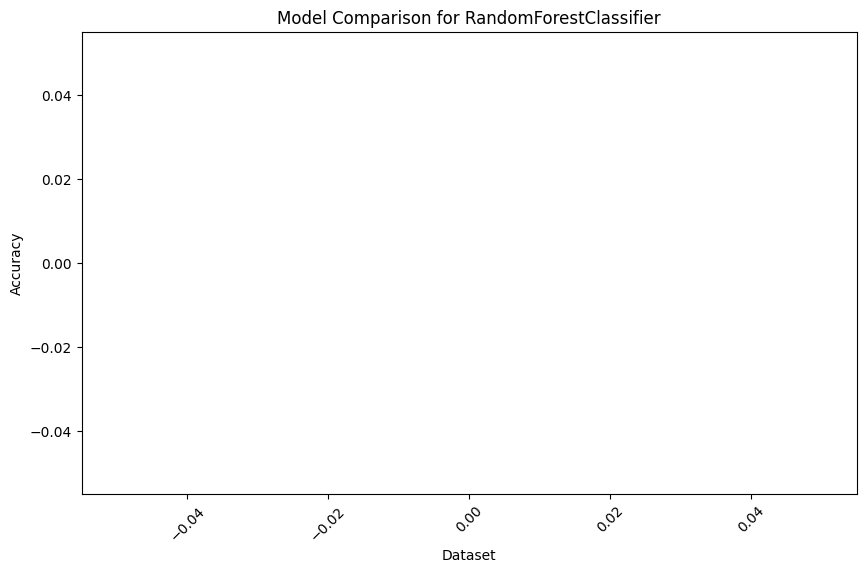

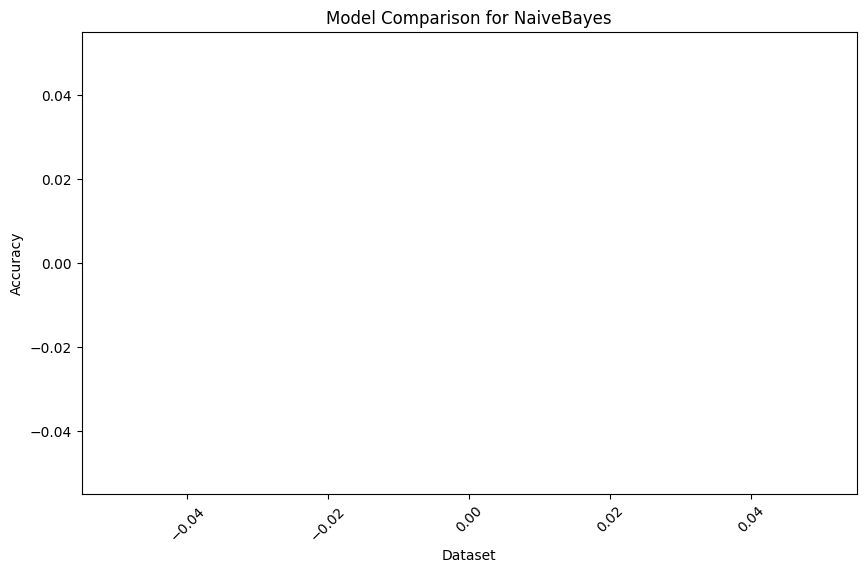

In [ ]:
# Data preprocessing and model training for classification models
target_variable_classification = 'classification_variable'  # Change this to the actual target variable
for key, df in data.items():
    if target_variable_classification in df.columns:
        df.dropna(subset=[target_variable_classification], inplace=True)
        # Check for missing values
        if df.isnull().values.any():
            # Impute missing values
            numerical_cols = df.select_dtypes(include='number').columns.tolist()
            imputer = SimpleImputer(strategy='mean')  # You can adjust the strategy as needed
            df[numerical_cols] = imputer.fit_transform(df[numerical_cols])

        for col in df.select_dtypes(include='object').columns:
            le = LabelEncoder()
            df[col] = le.fit_transform(df[col])

        X = df.drop(columns=[target_variable_classification])
        y = df[target_variable_classification]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        for model_name, model in classification_models.items():
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            accuracy = accuracy_score(y_test, y_pred)
            results[model_name][key] = accuracy

# Visualizing results (similar to the regression section)
for model_name, result in results.items():
    plt.figure(figsize=(10, 6))
    plt.bar(result.keys(), result.values())
    plt.title(f'Model Comparison for {model_name}')
    plt.xlabel('Dataset')
    plt.ylabel('Accuracy')
    plt.xticks(rotation=45)
    plt.show()

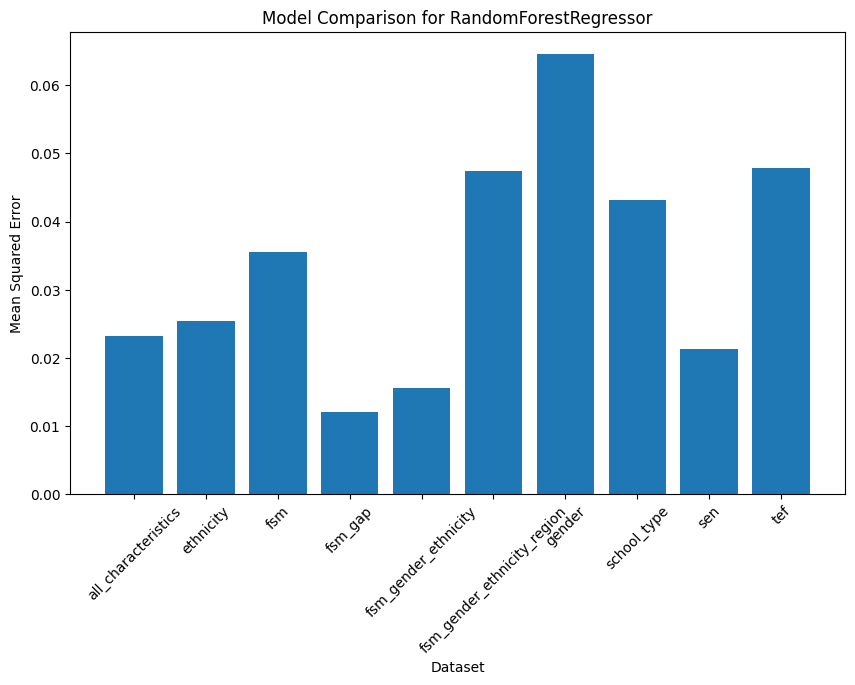

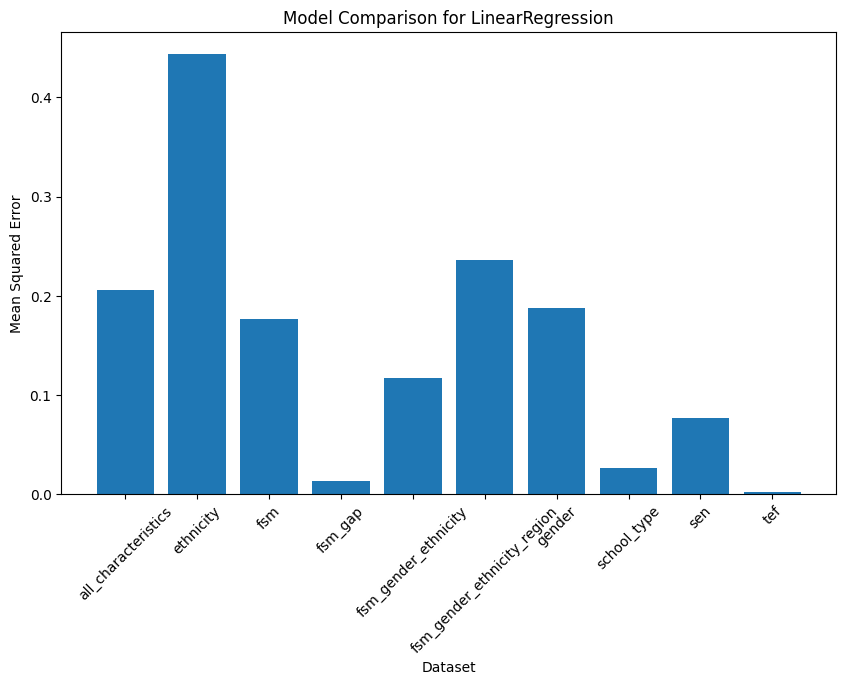

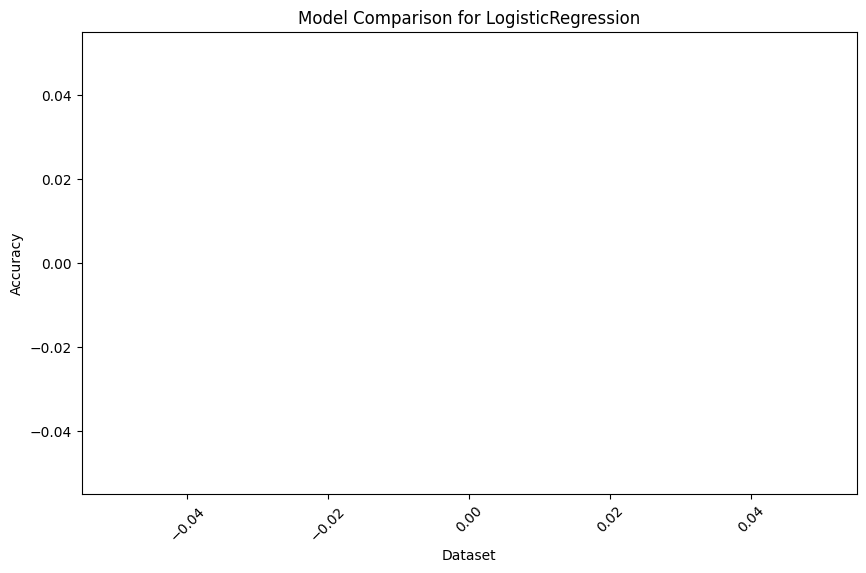

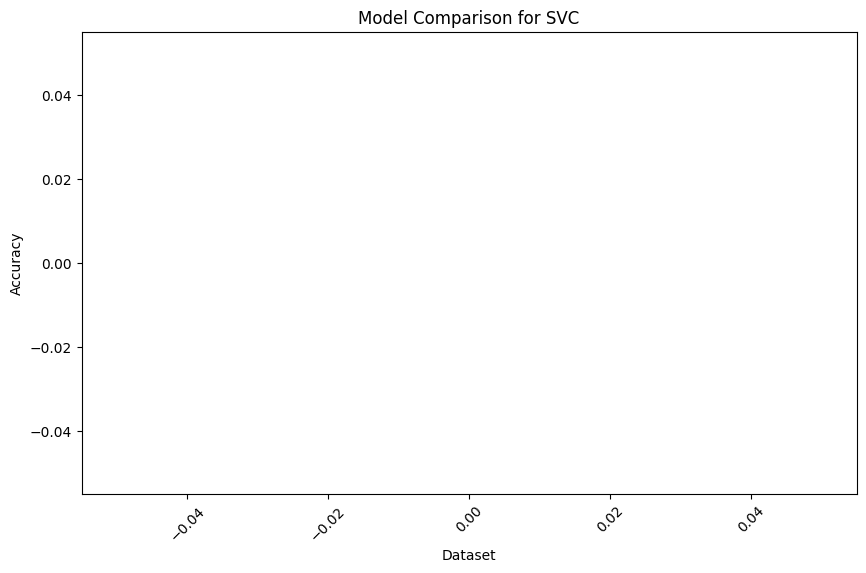

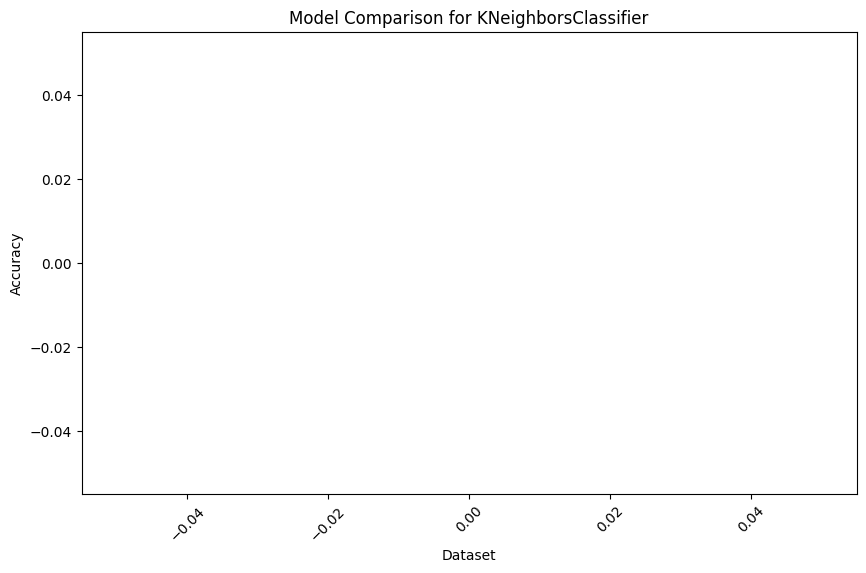

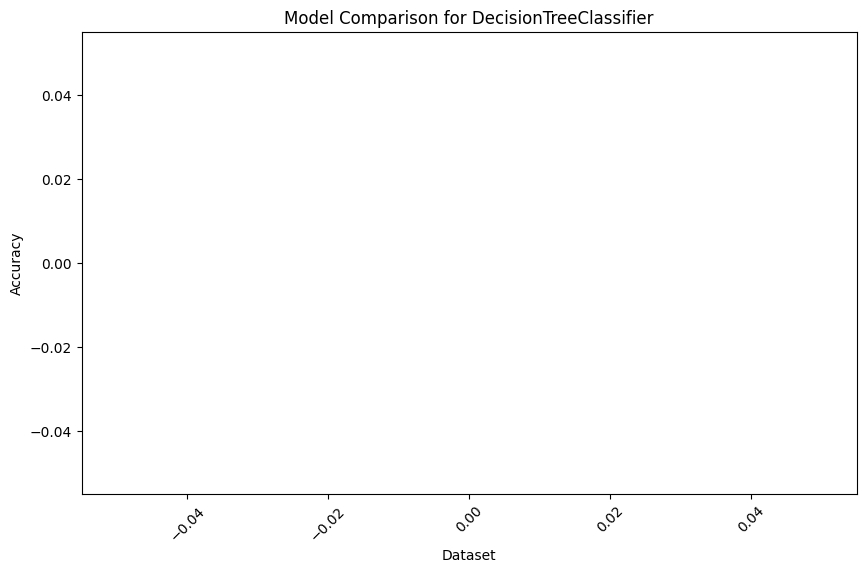

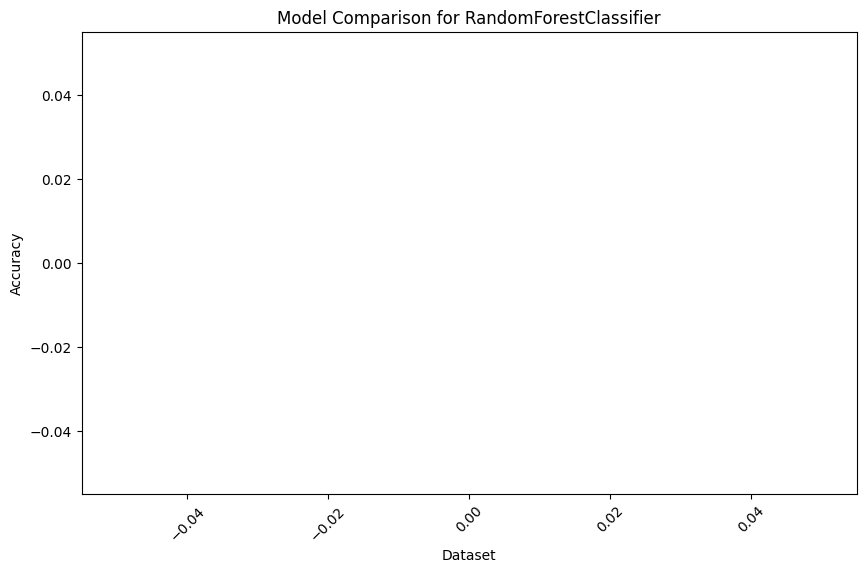

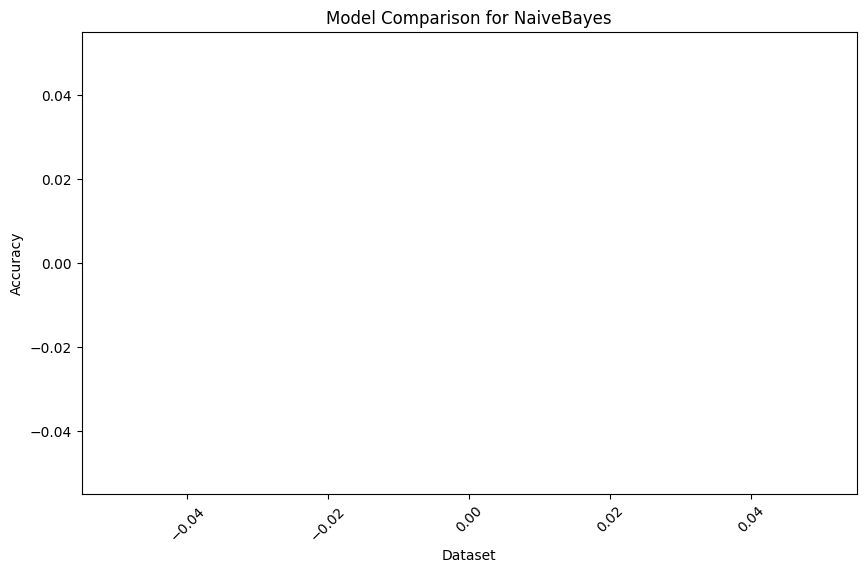

In [ ]:
# Data preprocessing and model training for classification models
target_variable_classification = 'your_classification_target_variable'  # Change this to your actual target variable for classification
for key, df in data.items():
    if target_variable_classification in df.columns:
        df.dropna(subset=[target_variable_classification], inplace=True)
        # Check for missing values
        if df.isnull().values.any():
            # Impute missing values if necessary
            numerical_cols = df.select_dtypes(include='number').columns.tolist()
            imputer = SimpleImputer(strategy='mean')  # Adjust the strategy as needed
            df[numerical_cols] = imputer.fit_transform(df[numerical_cols])

        # Encoding categorical variables
        for col in df.select_dtypes(include='object').columns:
            le = LabelEncoder()
            df[col] = le.fit_transform(df[col])

        X = df.drop(columns=[target_variable_classification])
        y = df[target_variable_classification]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Train classification models
        for model_name, model in classification_models.items():
            model.fit(X_train, y_train)
            # Evaluate the model
            if 'Classifier' in model_name:
                y_pred = model.predict(X_test)
                accuracy = accuracy_score(y_test, y_pred)
                results[model_name][key] = accuracy

import matplotlib.pyplot as plt

# Visualizing results for regression models
for model_name, result in results.items():
    if model_name in regression_models:
        plt.figure(figsize=(10, 6))
        plt.bar(result.keys(), result.values())
        plt.title(f'Model Comparison for {model_name}')
        plt.xlabel('Dataset')
        plt.ylabel('Mean Squared Error')
        plt.xticks(rotation=45)
        plt.show()

# Visualizing results for classification models
for model_name, result in results.items():
    if model_name in classification_models:
        plt.figure(figsize=(10, 6))
        plt.bar(result.keys(), result.values())
        plt.title(f'Model Comparison for {model_name}')
        plt.xlabel('Dataset')
        plt.ylabel('Accuracy')
        plt.xticks(rotation=45)
        plt.show()

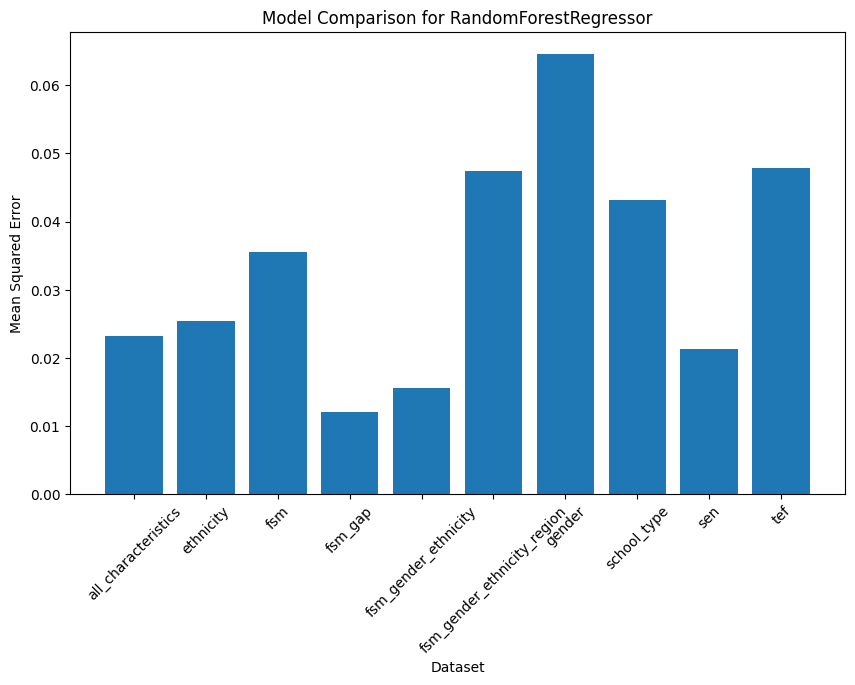

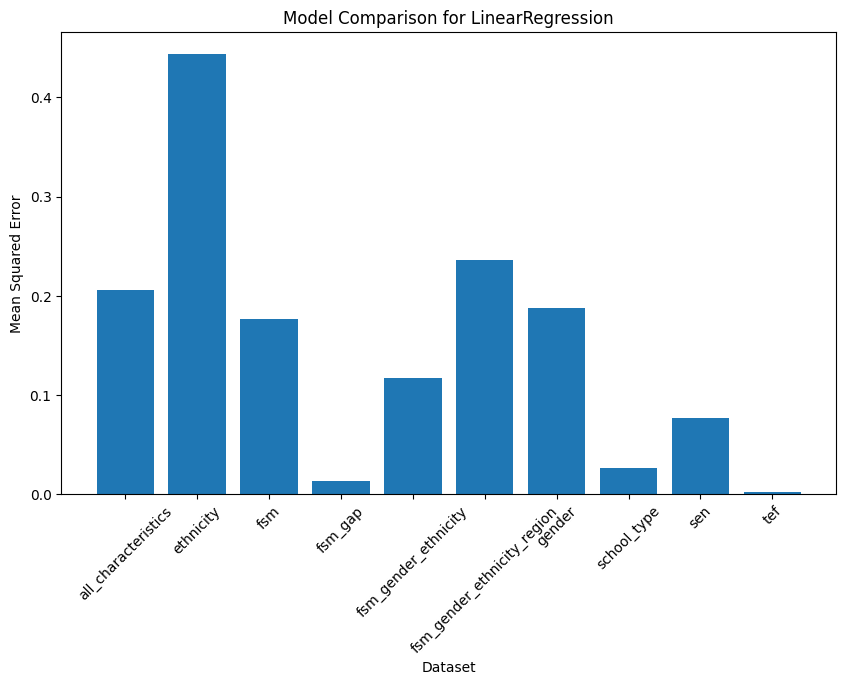

In [ ]:
from sklearn.model_selection import learning_curve
import numpy as np

# Define a function to plot learning curves
def plot_learning_curve(model, X, y, title):
    train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(model, X, y, cv=5, n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5), return_times=True)

    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    plt.xlabel('Training examples')
    plt.ylabel('Accuracy')
    plt.title(title)
    plt.legend(loc="best")
    plt.show()

# Visualizing results for regression and classification models
for model_name, result in results.items():
    if model_name in regression_models:
        plt.figure(figsize=(10, 6))
        plt.bar(result.keys(), result.values())
        plt.title(f'Model Comparison for {model_name}')
        plt.xlabel('Dataset')
        plt.ylabel('Mean Squared Error')
        plt.xticks(rotation=45)
        plt.show()
    elif model_name in classification_models:
        for dataset_key, df in data.items():
            if dataset_key in result:
                X = df.drop(columns=['progression_rate'])
                y = df['progression_rate']
                plot_learning_curve(classification_models[model_name], X, y, f'Learning Curve for {model_name} on {dataset_key}')

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

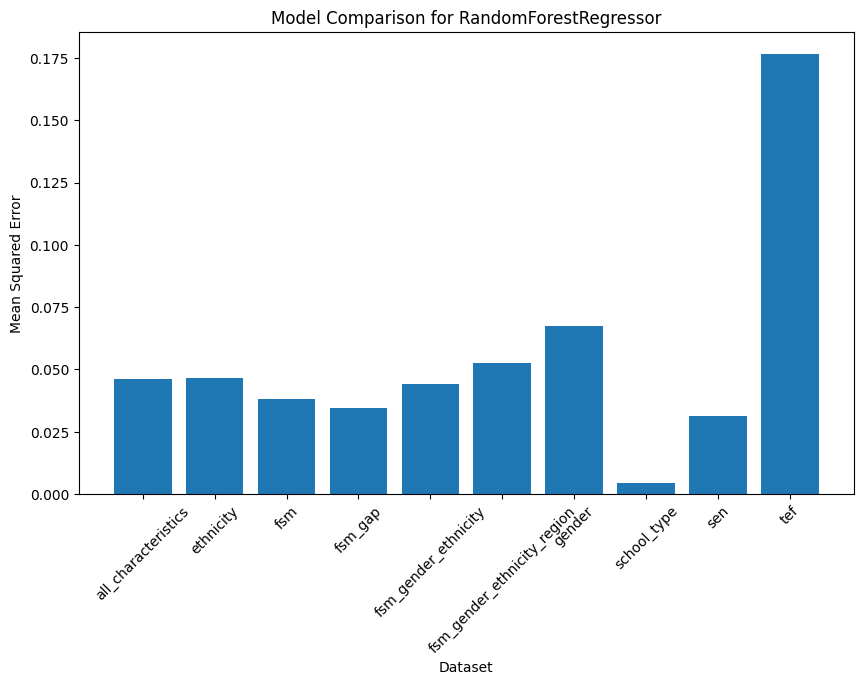

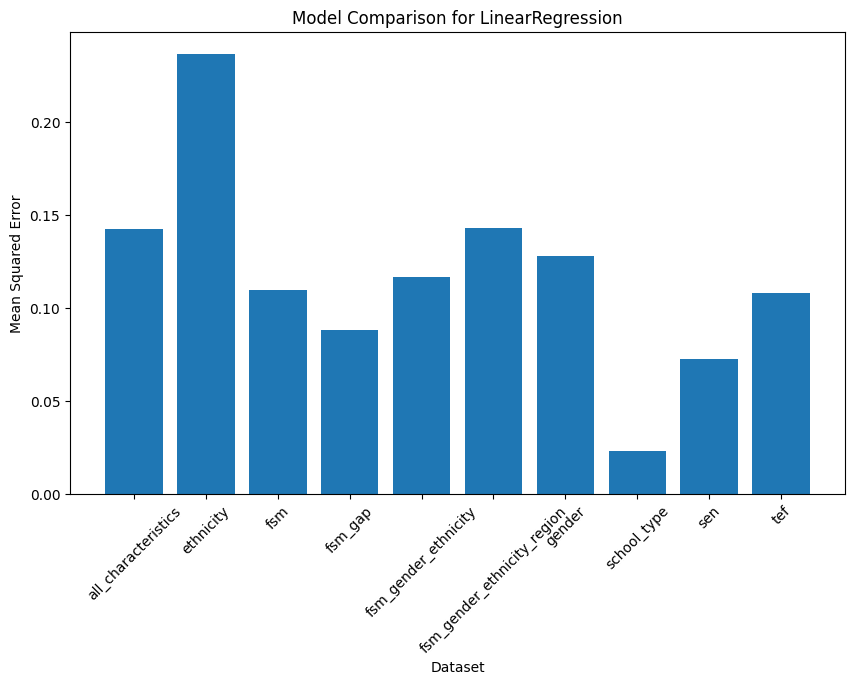

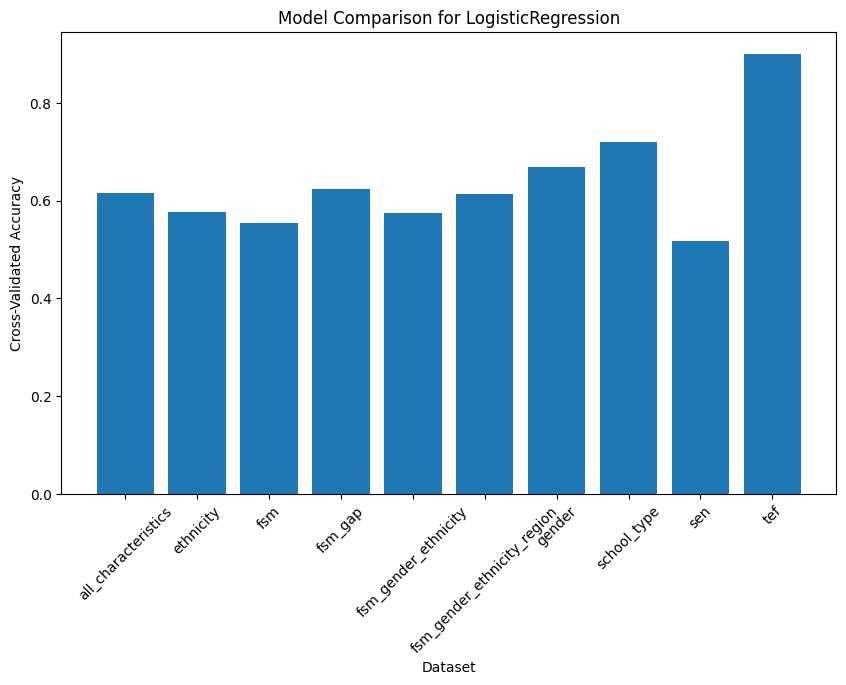

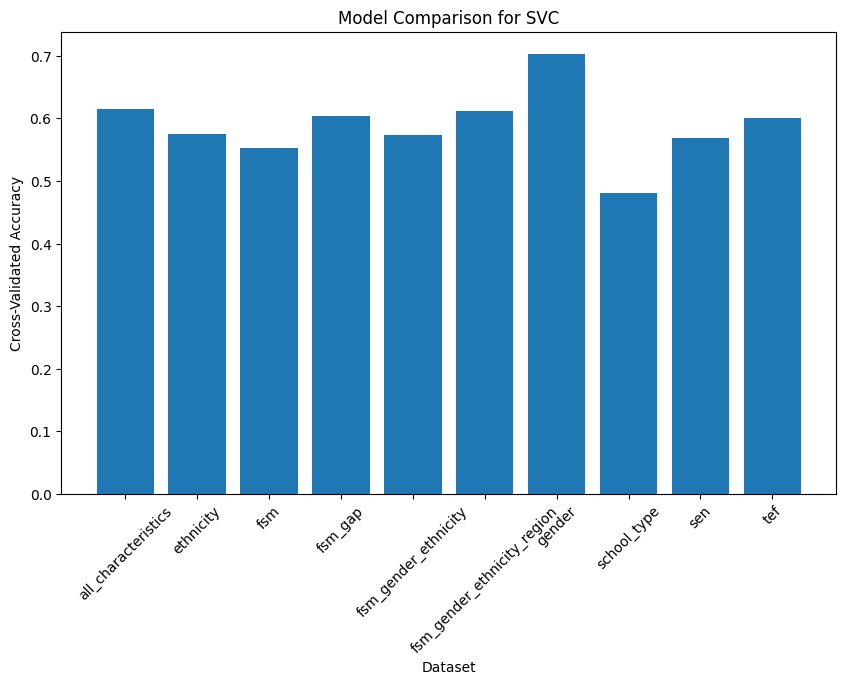

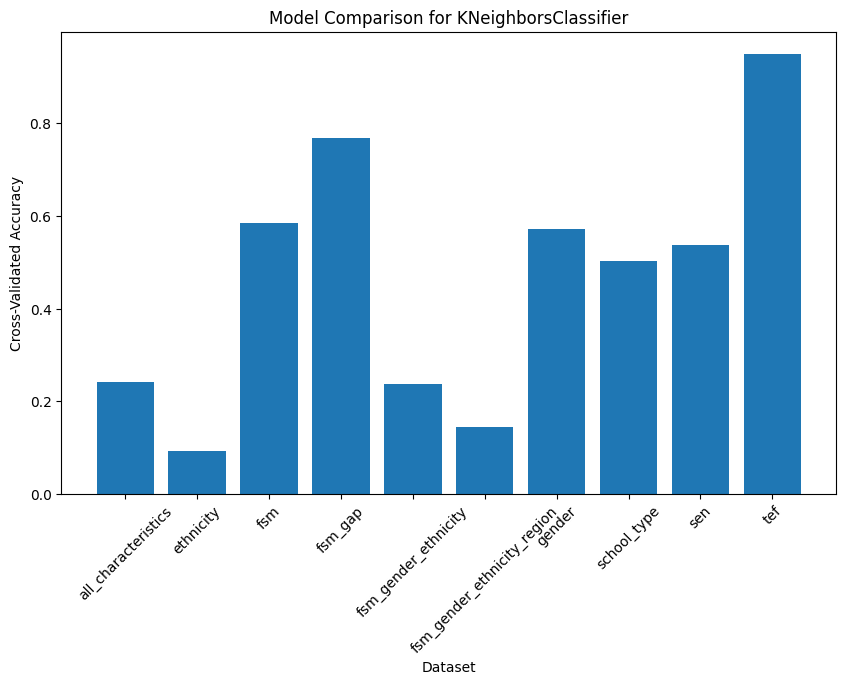

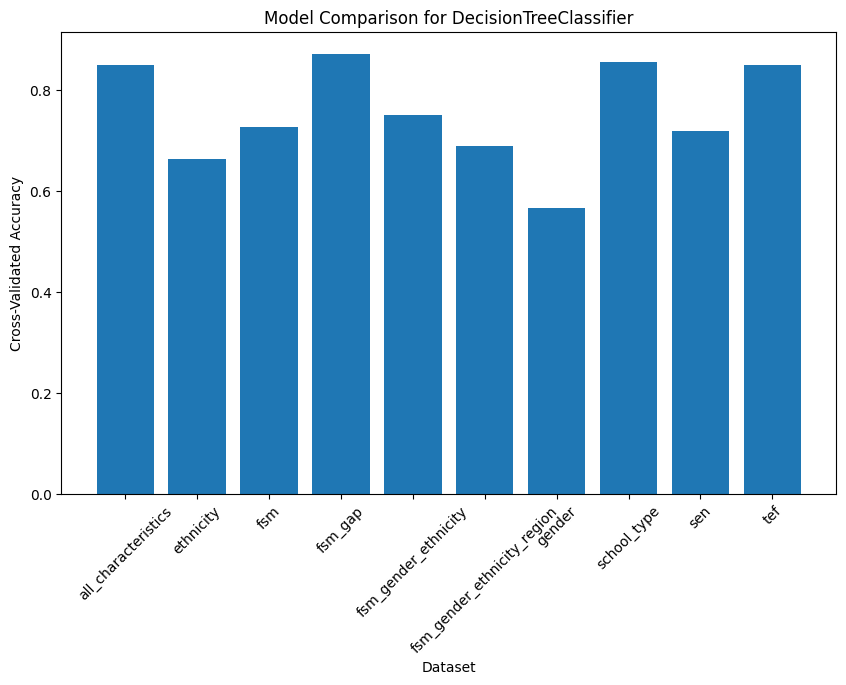

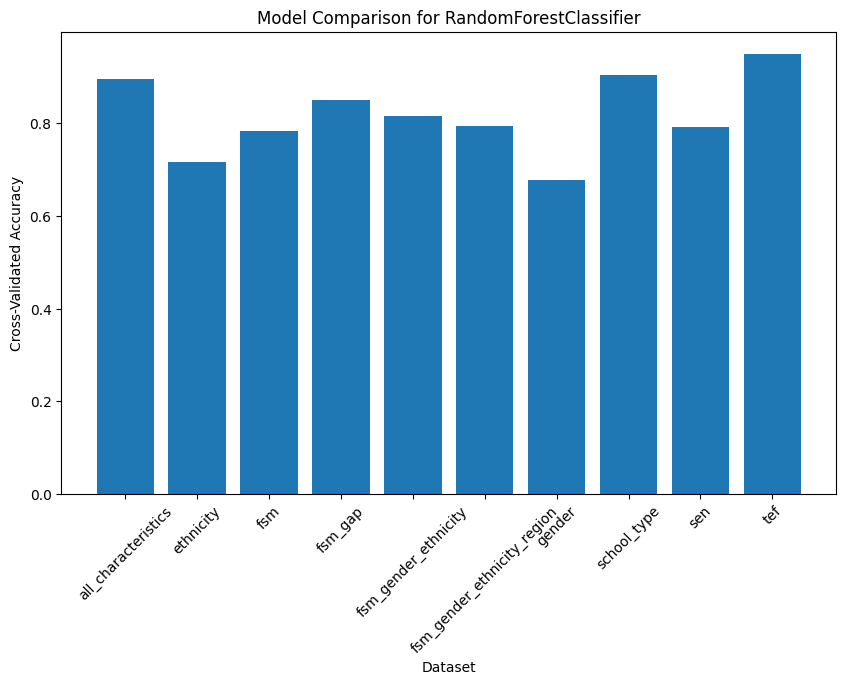

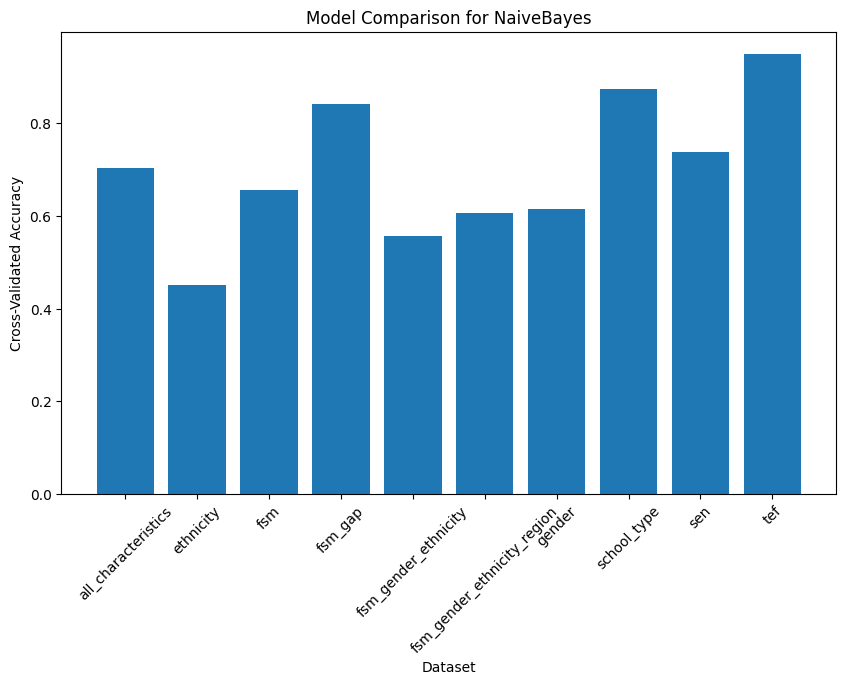

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.impute import SimpleImputer
import numpy as np
import pandas as pd

# Define the models
regression_models = {
    'RandomForestRegressor': RandomForestRegressor(),
    'LinearRegression': LinearRegression()
}

classification_models = {
    'LogisticRegression': LogisticRegression(),
    'SVC': SVC(),
    'KNeighborsClassifier': KNeighborsClassifier(),
    'DecisionTreeClassifier': DecisionTreeClassifier(),
    'RandomForestClassifier': RandomForestClassifier(),
    'NaiveBayes': GaussianNB()
}

# Initialize results dictionary
results = {model_name: {} for model_name in regression_models.keys()}
results.update({model_name: {} for model_name in classification_models.keys()})

# Data preprocessing and model training for regression models
target_variable = 'progression_rate'  # Change this to the actual target variable
for key, df in data.items():
    if target_variable in df.columns:
        df.dropna(subset=[target_variable], inplace=True)
        # Check for missing values
        if df.isnull().values.any():
            # Impute missing values
            numerical_cols = df.select_dtypes(include='number').columns.tolist()
            imputer = SimpleImputer(strategy='mean')  # You can adjust the strategy as needed
            df[numerical_cols] = imputer.fit_transform(df[numerical_cols])

        for col in df.select_dtypes(include='object').columns:
            le = LabelEncoder()
            df[col] = le.fit_transform(df[col])

        X = df.drop(columns=[target_variable])
        y = df[target_variable]

        # Convert the target variable to categorical for classification models
        y_categorical = pd.cut(y, bins=3, labels=[0, 1, 2])  # Change the bins and labels as needed

        X_train, X_test, y_train, y_test = train_test_split(X, y_categorical, test_size=0.2, random_state=42)

        for model_name, model in regression_models.items():
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            mse = mean_squared_error(y_test, y_pred)
            results[model_name][key] = mse

# Data preprocessing and model training for classification models
classification_results = {model_name: {} for model_name in classification_models.keys()}
for key, df in data.items():
    if target_variable in df.columns:
        df.dropna(subset=[target_variable], inplace=True)
        # Check for missing values
        if df.isnull().values.any():
            # Impute missing values
            numerical_cols = df.select_dtypes(include='number').columns.tolist()
            imputer = SimpleImputer(strategy='mean')  # You can adjust the strategy as needed
            df[numerical_cols] = imputer.fit_transform(df[numerical_cols])

        for col in df.select_dtypes(include='object').columns:
            le = LabelEncoder()
            df[col] = le.fit_transform(df[col])

        X = df.drop(columns=[target_variable])
        y = df[target_variable]

        # Convert the target variable to categorical for classification models
        y_categorical = pd.cut(y, bins=3, labels=[0, 1, 2])  # Change the bins and labels as needed

        for model_name, model in classification_models.items():
            scores = cross_val_score(model, X, y_categorical, cv=5)
            classification_results[model_name][key] = np.mean(scores)

# Visualizing results for regression models
for model_name, result in results.items():
    if model_name in regression_models:
        plt.figure(figsize=(10, 6))
        plt.bar(result.keys(), result.values())
        plt.title(f'Model Comparison for {model_name}')
        plt.xlabel('Dataset')
        plt.ylabel('Mean Squared Error')
        plt.xticks(rotation=45)
        plt.show()

# Visualizing results for classification models
for model_name, result in classification_results.items():
    plt.figure(figsize=(10, 6))
    plt.bar(result.keys(), result.values())
    plt.title(f'Model Comparison for {model_name}')
    plt.xlabel('Dataset')
    plt.ylabel('Cross-Validated Accuracy')
    plt.xticks(rotation=45)
    plt.show()